# Instalando e importando bibliotecas necessárias


In [ ]:
!pip install scikit-posthocs

In [ ]:
# Manipulação de Dados e Análise
import pandas as pd
import numpy as np
import time
import os
import json
from collections import Counter
from tqdm import tqdm
from typing import Optional, Union
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from joblib import Parallel, delayed
import itertools


# Mapa de Calor
import folium
from folium.plugins import HeatMap

# Visualização
import matplotlib.pyplot as plt
import seaborn as sns

# Pré-processamento e Modelagem
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.preprocessing import LabelEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Métricas, Estatística e Utilitários
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from scipy import stats
from scipy.stats import friedmanchisquare
import scikit_posthocs as sp
import warnings

# Configurações Globais de Reprodutibilidade
N_FOLDS = 5
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
sns.set_style("whitegrid")

# Carregando o Dataset

In [ ]:
data = pd.read_csv('Airbnb_Open_Data.csv', engine='python')

data.head()

,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price
0,Private room + garden 2mins walk to everywhere.,"2 rooms new apartment, your stay with private ...","2 bedroom apartment, you got one of the room a...","2 rooms new apartment, your stay with private ...",none,NaN,NaN,NaN,NaN,NaN,...,f,moderate,f,f,7,5,2,0,NaN,$58.00
1,"On the Beachfront, next to cafes and restaurants.",Beachfront balcony and next to cafes and resta...,"Happy to accommodate your requests, as best we...",Beachfront balcony and next to cafes and resta...,none,"Comfortable, relaxed, beachy with ample cafes ...",NaN,The bus stop is within 50m of the front door. ...,NaN,NaN,...,f,strict_14_with_grace_period,f,f,2,1,1,0,0.15,$125.00
2,Room in Camperdown,"Excellent location! Close to superb bars, cafe...",NaN,"Excellent location! Close to superb bars, cafe...",none,NaN,NaN,NaN,NaN,NaN,...,f,flexible,f,f,1,0,1,0,NaN,$99.00
3,Beautiful room in summer hill,"A Typical inner west sydney share house, you w...","Living room, out back balcony, kitchen, bathro...","A Typical inner west sydney share house, you w...",none,"Summer hill, is a gorgeous and quiet inner we...","Make yourself at home, enjoy a typical inner w...","Train is 5 minutes walking distance from house,",NaN,"I will be away in Europe, so won’t be able to ...",...,f,strict_14_with_grace_period,f,f,1,0,1,0,NaN,$99.00
4,2 Bedroom Apartment in Kensington.,2 Bedroom Loft Apartment in a small complex. W...,NaN,2 Bedroom Loft Apartment in a small complex. W...,none,NaN,NaN,NaN,NaN,NaN,...,f,flexible,f,f,1,1,0,0,0.05,$125.00


# **Análise Exploratória de Dados (EDA)**

## Descrição das Colunas


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9838 entries, 0 to 9837
Data columns (total 83 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   name                                          9838 non-null   object 
 1   summary                                       9838 non-null   object 
 2   space                                         7184 non-null   object 
 3   description                                   9838 non-null   object 
 4   experiences_offered                           9838 non-null   object 
 5   neighborhood_overview                         6400 non-null   object 
 6   notes                                         4300 non-null   object 
 7   transit                                       6469 non-null   object 
 8   access                                        5946 non-null   object 
 9   interaction                                   5957 non-null   o

# **Análise Exploratória**

## Preparação do ambiente e limpeza inicial


In [ ]:
Y_col = 'price'
df_clean = data.copy()

def clean_price(price_str):
    if isinstance(price_str, str):
        return float(price_str.replace('$', '').replace(',', ''))
    return float(price_str)

def clean_percentage(perc_str):
    if isinstance(perc_str, str):
        return float(perc_str.replace('%', '')) / 100
    return float(perc_str)

df_clean[Y_col] = df_clean[Y_col].apply(clean_price)
if 'host_response_rate' in df_clean.columns:
    df_clean['host_response_rate'] = df_clean['host_response_rate'].apply(clean_percentage)

date_cols = ['host_since', 'first_review', 'last_review']
for col in date_cols:
    if col in df_clean.columns:
        df_clean[col] = pd.to_datetime(df_clean[col], errors='coerce')

print("Limpeza inicial de dados concluída: 'price', 'host_response_rate' e colunas de data foram tratadas.")

Limpeza inicial de dados concluída: 'price', 'host_response_rate' e colunas de data foram tratadas.


In [ ]:
cols_to_drop = [
    'experiences_offered',
    'requires_license',
    'host_acceptance_rate',

    'name',
    'summary',
    'space',
    'description',
    'neighborhood_overview',
    'notes',
    'access',
    'transit',
    'interaction',
    'house_rules',
    'street',
    'neighbourhood',
    'city'
]

print(f"\nRemovendo {len(cols_to_drop)} colunas desnecessárias (texto e variância zero)...")
df_clean = df_clean.drop(columns=cols_to_drop, errors='ignore')

print("Colunas removidas com sucesso!")
print(f"Número de colunas restantes: {df_clean.shape[1]}")


Removendo 16 colunas desnecessárias (texto e variância zero)...
Colunas removidas com sucesso!
Número de colunas restantes: 67


## Visão Geral e Integridade de Dados

In [ ]:
print("Visão Geral do Dataset")
df_clean.info(memory_usage='deep')

print("\n\n--- Estatísticas Descritivas das Features Numéricas ---")
pd.set_option('display.float_format', lambda x: '%.2f' % x)
print(df_clean.describe())

print("\n\n--- Análise de Valores Ausentes (Colunas com mais de 1% de ausência) ---")
missing_vals = df_clean.isnull().sum()
missing_perc = (missing_vals / len(df_clean)) * 100
missing_report = pd.DataFrame({'Contagem Ausente': missing_vals, 'Percentual Ausente (%)': missing_perc})
print(missing_report[missing_report['Percentual Ausente (%)'] > 1].sort_values(by='Percentual Ausente (%)', ascending=False))

Visão Geral do Dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9838 entries, 0 to 9837
Data columns (total 67 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   host_id                                       9838 non-null   int64         
 1   host_since                                    9838 non-null   datetime64[ns]
 2   host_location                                 9830 non-null   object        
 3   host_about                                    5475 non-null   object        
 4   host_response_time                            5272 non-null   object        
 5   host_response_rate                            5272 non-null   float64       
 6   host_is_superhost                             9838 non-null   object        
 7   host_neighbourhood                            6923 non-null   object        
 8   host_listings_count                          

## Análise do atributo de saída (price)


--- Resumo Estatístico da Variável Alvo: Price ---
count   9838.00
mean     214.68
std      250.72
min       52.00
25%       89.00
50%      146.00
75%      236.00
max     4656.00
Name: price, dtype: float64


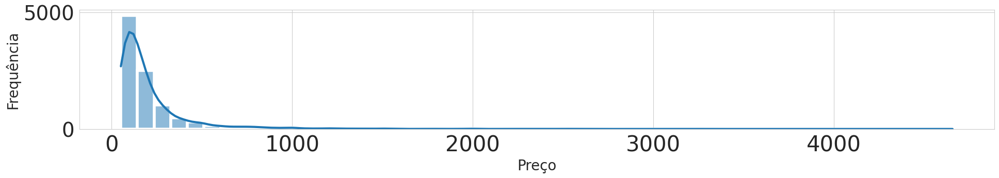

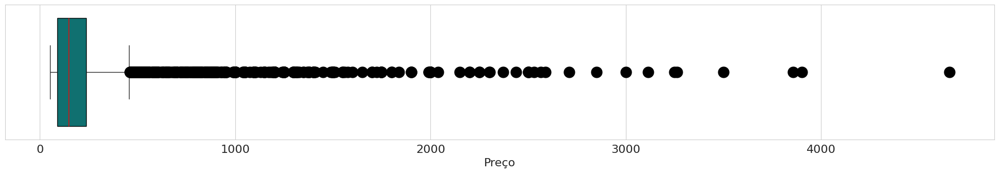

In [ ]:
price_summary = df_clean[Y_col].describe()
print("\n--- Resumo Estatístico da Variável Alvo: Price ---")
print(price_summary)

plt.rcParams['lines.linewidth'] = 3.0

fig_hist, ax_hist = plt.subplots(figsize=(20, 4))

sns.histplot(
    df_clean[Y_col],
    kde=True,
    bins=50,
    ax=ax_hist,
    linewidth=4.0
)

ax_hist.set_xlabel('Preço', fontsize=20)
ax_hist.set_ylabel('Frequência', fontsize=20)
ax_hist.tick_params(axis='x', labelsize=30)
ax_hist.tick_params(axis='y', labelsize=28)

plt.tight_layout(pad=3.0)

fig_box, ax_box = plt.subplots(figsize=(20, 4))

sns.boxplot(
    x=df_clean[Y_col],
    color='teal',
    ax=ax_box,
    boxprops={'edgecolor': 'black', 'linewidth': 1.0},
    medianprops={'color': 'red', 'linewidth': 1.0},
    whiskerprops={'linewidth': 1.0},
    capprops={'linewidth': 1.0},
    flierprops={'marker': 'o', 'markerfacecolor': 'black', 'markeredgecolor': 'black', 'markersize': 15}
)

ax_box.set_xlabel('Preço', fontsize=16)
ax_box.tick_params(axis='x', labelsize=16)

plt.tight_layout(pad=3.0)

plt.show()

# Análise de Normalidade (Atributo de saída)


Teste de Shapiro-Wilk para 'price' (amostra de 5000 pontos):
P-valor: 0.0000000000


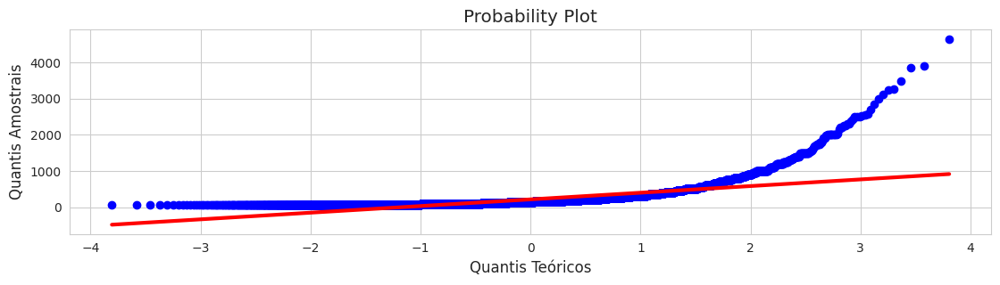

In [ ]:
def clean_price(price_str):
    if isinstance(price_str, str):
        return float(price_str.replace('$', '').replace(',', ''))
    return float(price_str)
price_data = df_clean['price'].apply(clean_price).dropna()

sample_size = min(len(price_data), 5000)
shapiro_stat, shapiro_p_value = stats.shapiro(price_data.sample(sample_size, random_state=RANDOM_STATE))
print(f"\nTeste de Shapiro-Wilk para 'price' (amostra de {sample_size} pontos):")
print(f"P-valor: {shapiro_p_value:.10f}")

plt.rcParams['lines.linewidth'] = 3.0
plt.rcParams['font.size'] = 12

fig_qq, ax_qq = plt.subplots(figsize=(12, 4))

stats.probplot(price_data, dist="norm", plot=ax_qq)
ax_qq.set_xlabel('Quantis Teóricos', fontsize=12)
ax_qq.set_ylabel('Quantis Amostrais', fontsize=12)
ax_qq.tick_params(axis='x', labelsize=10)
ax_qq.tick_params(axis='y', labelsize=10)
plt.tight_layout(pad=3.0)

plt.show()

## Análise de Correlação Numérica

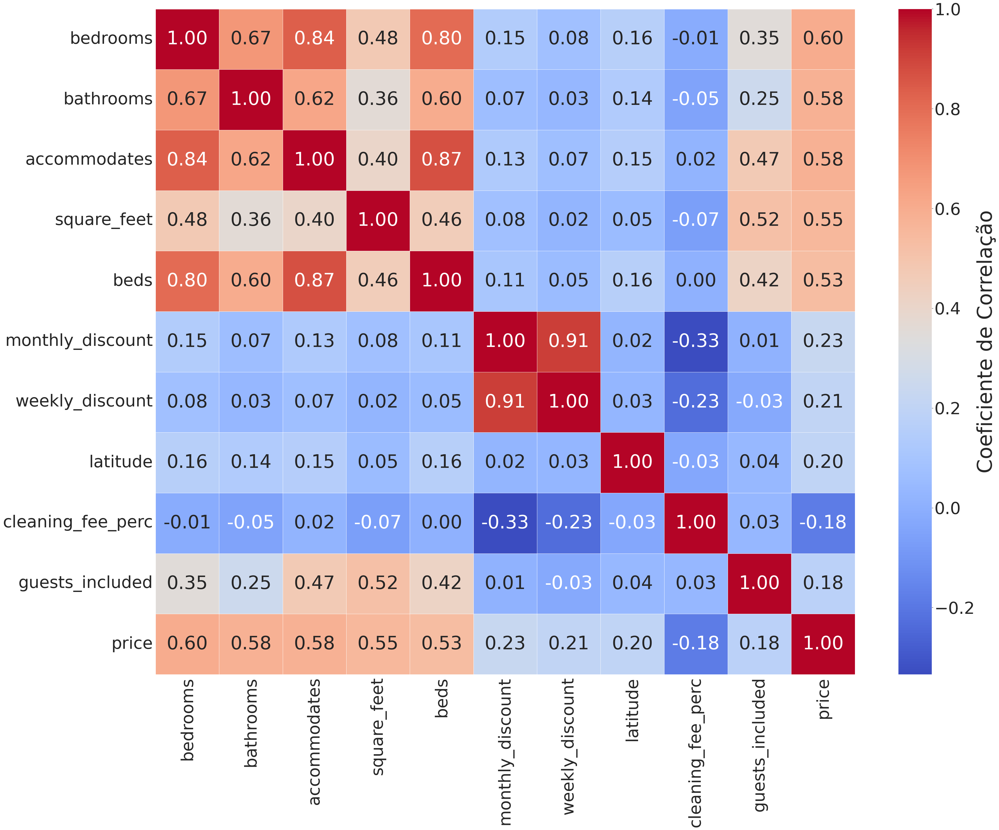

In [ ]:
numerical_cols = df_clean.select_dtypes(include=np.number).columns.tolist()
Y_col = 'price'

if Y_col in numerical_cols:
    correlation_matrix = df_clean[numerical_cols].corr()
    price_correlation = correlation_matrix[Y_col].sort_values(ascending=False).drop(Y_col)
else:
    print(f"ERRO: Coluna alvo '{Y_col}' não encontrada ou não é numérica.")

top_corr_features = price_correlation.abs().nlargest(10).index.tolist() + [Y_col]
top_corr_matrix = df_clean[top_corr_features].corr()

plt.rcParams['font.size'] = 50
plt.rcParams['axes.titlesize'] = 60
plt.rcParams['axes.labelsize'] = 55
plt.rcParams['xtick.labelsize'] = 45
plt.rcParams['ytick.labelsize'] = 45

fig, ax = plt.subplots(figsize=(40, 36))

sns.heatmap(
    top_corr_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=.5,
    cbar_kws={'label': 'Coeficiente de Correlação'},
    ax=ax
)

plt.tight_layout(rect=[0, 0, 1, 0.9])

plt.show()

# Análise de Variância das Features

In [ ]:
print("Análise de Variância das Features")

unique_counts = df_clean.nunique()
zero_variance_cols = unique_counts[unique_counts == 1].index.tolist()
low_variance_cols = unique_counts[(unique_counts > 1) & (unique_counts <= 3)].index.tolist()

if zero_variance_cols:
    print("\nFeatures com Variância Zero (constantes):")
    print(zero_variance_cols)

if low_variance_cols:
    print("\nFeatures com Baixa Variância (2 ou 3 valores únicos):")
    print(low_variance_cols)

Análise de Variância das Features

Features com Variância Zero (constantes):
['is_business_travel_ready']

Features com Baixa Variância (2 ou 3 valores únicos):
['host_is_superhost', 'host_identity_verified', 'is_location_exact', 'room_type', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification']


## Análise de comodidades (amenities)

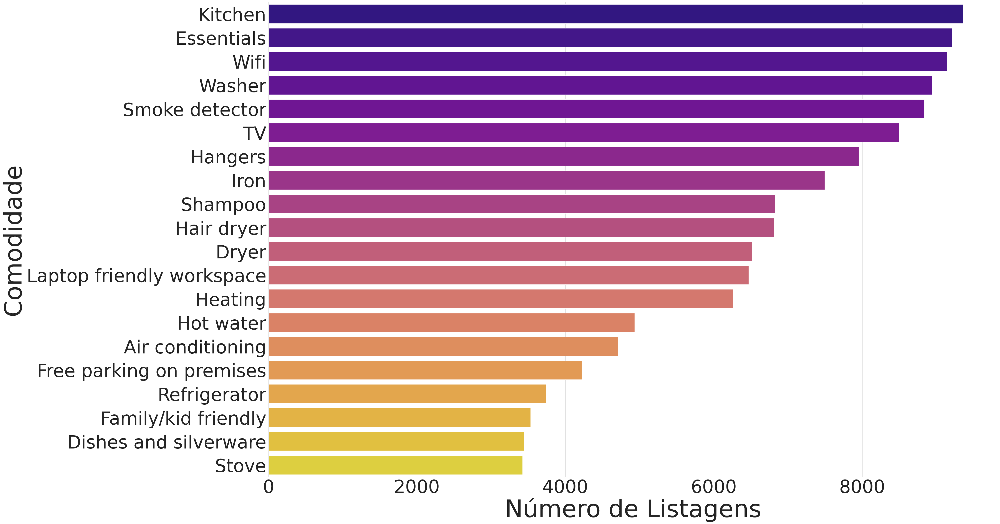

In [ ]:
amenities_list = df_clean['amenities'].str.replace('[{}"\']', '', regex=True).dropna().tolist()
all_amenities = Counter([item.strip() for sublist in [s.split(',') for s in amenities_list] for item in sublist if item.strip()])

top_amenities = pd.DataFrame(all_amenities.most_common(20), columns=['Comodidade', 'Contagem'])

plt.rcParams['font.size'] = 50
plt.rcParams['axes.titlesize'] = 80

plt.figure(figsize=(50, 28.125))
ax = sns.barplot(
    data=top_amenities,
    x='Contagem',
    y='Comodidade',
    hue='Comodidade',
    palette='plasma',
    orient='h',
    legend=False
)

plt.xlabel('Número de Listagens', fontsize=80)

ax.tick_params(axis='y', labelsize=60)
ax.tick_params(axis='x', labelsize=60)

plt.tight_layout(pad=3.0)
plt.show()

## Análise Geoespacial - Distribuição dos Imóveis

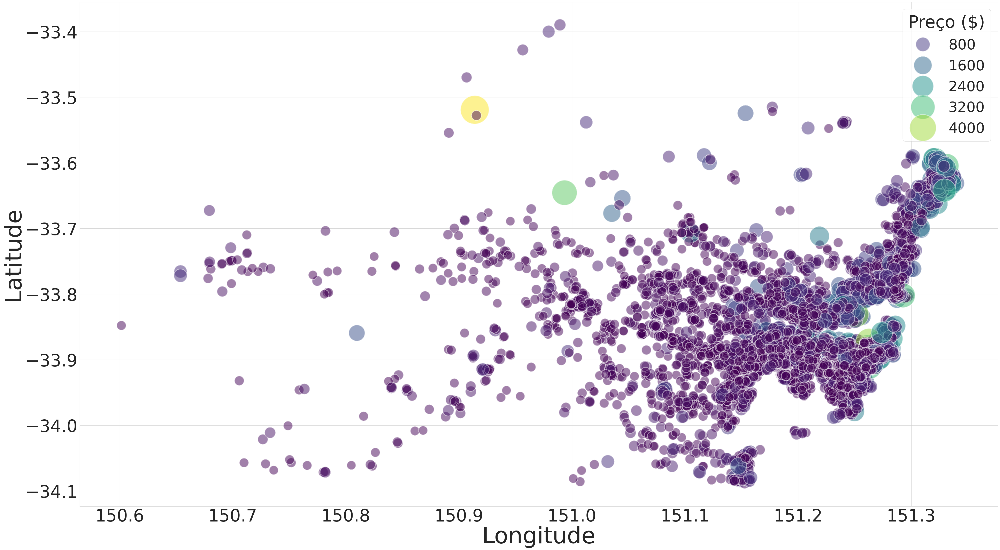

In [ ]:
df_map = df_clean

plt.rcParams['axes.labelsize'] = 80
plt.rcParams['xtick.labelsize'] = 60
plt.rcParams['ytick.labelsize'] = 60

plt.figure(figsize=(50, 28.125))
sns.scatterplot(
    data=df_map,
    x='longitude',
    y='latitude',
    hue=Y_col,
    palette='viridis',
    size=Y_col,
    sizes=(1000, 10000),
    alpha=0.5,
    legend='auto'
)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(
    title='Preço ($)',
    fontsize=50,
    title_fontsize=60
)
plt.tight_layout()
plt.show()

# **Mapa de Calor Geoespacial do Preço**

In [ ]:
df_map = df_clean[['latitude', 'longitude', 'price']].copy()
df_map.dropna(inplace=True)

def clean_price(price_str):
    if isinstance(price_str, str):
        return float(price_str.replace('$', '').replace(',', ''))
    return float(price_str)

df_map['price'] = df_map['price'].apply(clean_price)
heat_data = df_map[['latitude', 'longitude', 'price']].values.tolist()
center_lat = df_map['latitude'].median()
center_lon = df_map['longitude'].median()

m = folium.Map(location=[center_lat, center_lon], zoom_start=11, tiles='cartodbdarkmatter')

HeatMap(heat_data, radius=15, blur=20).add_to(m)

os.makedirs('results', exist_ok=True)
map_filename = 'results/mapa_calor_preco.html'
m.save(map_filename)

print(f"Mapa de Calor interativo salvo em: {map_filename}")

Mapa de Calor interativo salvo em: results/mapa_calor_preco.html


# Tratamento de valores ausentes

## Identificação de Colunas para Imputação

In [ ]:
df_imputed = df_clean.copy()

missing_report = df_imputed.isnull().sum()
cols_with_missing = missing_report[missing_report > 0].index.tolist()

numerical_missing = [col for col in cols_with_missing if df_imputed[col].dtype in ['int64', 'float64']]
categorical_missing = [col for col in cols_with_missing if df_imputed[col].dtype in ['object', 'category']]

## Análise e Imputação para Dados NUMÉRICOS Ausentes

In [ ]:
for col in numerical_missing:
    if not df_imputed[col].dropna().empty:
        skewness = df_imputed[col].skew()
        if abs(skewness) > 1.0:
            strategy = 'Mediana'
            value_to_impute = df_imputed[col].median()
        else:
            strategy = 'Média'
            value_to_impute = df_imputed[col].mean()

    df_imputed[col] = df_imputed[col].fillna(value_to_impute)
    print(f"Coluna '{col}' imputada com a {strategy} ({value_to_impute:.2f}).")

Coluna 'host_response_rate' imputada com a Mediana (1.00).
Coluna 'bathrooms' imputada com a Mediana (1.00).
Coluna 'bedrooms' imputada com a Mediana (1.00).
Coluna 'beds' imputada com a Mediana (2.00).
Coluna 'square_feet' imputada com a Mediana (0.00).
Coluna 'weekly_discount' imputada com a Mediana (12.95).
Coluna 'monthly_discount' imputada com a Mediana (25.09).
Coluna 'security_deposit_perc' imputada com a Mediana (164.00).
Coluna 'cleaning_fee_perc' imputada com a Mediana (44.00).
Coluna 'review_scores_rating' imputada com a Mediana (97.00).
Coluna 'review_scores_accuracy' imputada com a Mediana (10.00).
Coluna 'review_scores_cleanliness' imputada com a Mediana (10.00).
Coluna 'review_scores_checkin' imputada com a Mediana (10.00).
Coluna 'review_scores_communication' imputada com a Mediana (10.00).
Coluna 'review_scores_location' imputada com a Mediana (10.00).
Coluna 'review_scores_value' imputada com a Mediana (10.00).
Coluna 'reviews_per_month' imputada com a Mediana (0.44).

## Análise e Imputação para Dados CATEGÓRICOS Ausentes

In [ ]:
high_cardinality_text_cols = ['space', 'notes', 'transit', 'access', 'interaction',
                              'house_rules', 'host_about', 'neighborhood_overview', 'summary']

for col in categorical_missing:

    mode_val = df_imputed[col].mode()[0]


    df_imputed[col] = df_imputed[col].fillna(mode_val)


    mode_print = (str(mode_val)[:75] + '...') if len(str(mode_val)) > 75 else str(mode_val)
    print(f"Coluna '{col}' imputada com a Moda ('{mode_print}').")

Coluna 'host_location' imputada com a Moda ('Sydney, New South Wales, Australia').
Coluna 'host_about' imputada com a Moda ('My team and I at The Apartment Service are proud to have been helping peopl...').
Coluna 'host_response_time' imputada com a Moda ('within an hour').
Coluna 'host_neighbourhood' imputada com a Moda ('Bondi Beach').
Coluna 'zipcode' imputada com a Moda ('2026').
Coluna 'cancellation_policy' imputada com a Moda ('strict_14_with_grace_period').


# Análise e Imputação para DATAS faltantes

In [ ]:
date_cols_missing = [col for col in df_imputed.columns if df_imputed[col].isnull().sum() > 0 and 'datetime' in str(df_imputed[col].dtype)]

for col in date_cols_missing:
    median_date = df_imputed[col].median()

    df_imputed[col] = df_imputed[col].fillna(median_date)
    print(f"Coluna de data '{col}' imputada com a Mediana ({median_date.strftime('%Y-%m-%d')}).")

Coluna de data 'first_review' imputada com a Mediana (2017-12-25).
Coluna de data 'last_review' imputada com a Mediana (2019-02-21).


## Verificação final

In [ ]:
remaining_missing = df_imputed.isnull().sum().sum()

if remaining_missing == 0:
    print("Sucesso! O DataFrame foi completamente imputado e está pronto para a próxima etapa.")
else:
    print(f"Atenção! Ainda restam {remaining_missing} valores ausentes.")

Sucesso! O DataFrame foi completamente imputado e está pronto para a próxima etapa.


In [ ]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9838 entries, 0 to 9837
Data columns (total 67 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   host_id                                       9838 non-null   int64         
 1   host_since                                    9838 non-null   datetime64[ns]
 2   host_location                                 9838 non-null   object        
 3   host_about                                    9838 non-null   object        
 4   host_response_time                            9838 non-null   object        
 5   host_response_rate                            9838 non-null   float64       
 6   host_is_superhost                             9838 non-null   object        
 7   host_neighbourhood                            9838 non-null   object        
 8   host_listings_count                           9838 non-null   float6

# Criando novas features

In [ ]:
df_with_features = df_imputed.copy()
y_series = df_with_features['price']

if 'amenities' in df_with_features.columns:
    df_with_features['amenities_count'] = df_with_features['amenities'].str.count(',') + 1
    df_with_features.loc[df_with_features['amenities'] == '{}', 'amenities_count'] = 0

    luxury_terms = 'Jacuzzi|Pool|Sauna|Gym|Breakfast|Hot Tub|Fireplace|Waterfront'
    df_with_features['has_luxury_amenity'] = df_with_features['amenities'].str.contains(luxury_terms, case=False, na=False).astype(int)

if 'neighbourhood_cleansed' in df_with_features.columns:
    target_means = y_series.groupby(df_with_features['neighbourhood_cleansed']).mean()
    df_with_features['target_encoded_location'] = df_with_features['neighbourhood_cleansed'].map(target_means)

if all(c in df_with_features.columns for c in ['room_type', 'target_encoded_location']):
    mean_target_location = df_with_features['target_encoded_location'].mean()
    df_with_features['location_x_roomtype'] = ((df_with_features['room_type'] == 'Entire home/apt') & (df_with_features['target_encoded_location'] > mean_target_location)).astype(int)

In [ ]:
df_with_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9838 entries, 0 to 9837
Data columns (total 71 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   host_id                                       9838 non-null   int64         
 1   host_since                                    9838 non-null   datetime64[ns]
 2   host_location                                 9838 non-null   object        
 3   host_about                                    9838 non-null   object        
 4   host_response_time                            9838 non-null   object        
 5   host_response_rate                            9838 non-null   float64       
 6   host_is_superhost                             9838 non-null   object        
 7   host_neighbourhood                            9838 non-null   object        
 8   host_listings_count                           9838 non-null   float6

## Tratando outliers (IQR)

In [ ]:
df_final = df_with_features.copy()

numerical_cols_to_treat = df_final.select_dtypes(include=np.number).columns.tolist()

if 'price' in numerical_cols_to_treat:
     numerical_cols_to_treat.remove('price')

for col in numerical_cols_to_treat:
    Q1 = df_final[col].quantile(0.25)
    Q3 = df_final[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers_before = ((df_final[col] < lower_bound) | (df_final[col] > upper_bound)).sum()
    if outliers_before > 0:

        df_final[col] = np.clip(df_final[col], lower_bound, upper_bound)
        print(f"Coluna '{col}': {outliers_before} outliers tratados.")

print("\nTratamento de outliers concluído.")
print(f"Dataset final com {df_final.shape[0]} linhas e {df_final.shape[1]} colunas.")

Coluna 'host_id': 99 outliers tratados.
Coluna 'host_response_rate': 1163 outliers tratados.
Coluna 'host_listings_count': 1433 outliers tratados.
Coluna 'host_total_listings_count': 1433 outliers tratados.
Coluna 'latitude': 732 outliers tratados.
Coluna 'longitude': 479 outliers tratados.
Coluna 'accommodates': 740 outliers tratados.
Coluna 'bathrooms': 124 outliers tratados.
Coluna 'bedrooms': 747 outliers tratados.
Coluna 'beds': 188 outliers tratados.
Coluna 'square_feet': 21 outliers tratados.
Coluna 'weekly_discount': 898 outliers tratados.
Coluna 'monthly_discount': 535 outliers tratados.
Coluna 'security_deposit_perc': 1139 outliers tratados.
Coluna 'cleaning_fee_perc': 702 outliers tratados.
Coluna 'guests_included': 1130 outliers tratados.
Coluna 'extra_people_perc': 828 outliers tratados.
Coluna 'minimum_nights': 589 outliers tratados.
Coluna 'maximum_nights': 2 outliers tratados.
Coluna 'minimum_minimum_nights': 520 outliers tratados.
Coluna 'maximum_minimum_nights': 904 o

# Conversão de texto para número (Label Encoding)

In [ ]:
categorical_cols = df_final.select_dtypes(exclude=np.number).columns

le = LabelEncoder()

for col in categorical_cols:
    df_final[col] = le.fit_transform(df_final[col])

print("\nCodificação finalizada com sucesso!")
print(f"O número de colunas foi mantido em: {df_final.shape[1]}")


Codificação finalizada com sucesso!
O número de colunas foi mantido em: 71


# Análise de Multicolinearidade

In [ ]:
correlation_threshold = 0.90
vif_threshold = 10.0
df_temp = df_final.copy()

numeric_cols = df_temp.select_dtypes(include=np.number).columns.tolist()
if 'price' in numeric_cols: numeric_cols.remove('price')
df_numeric = df_temp[numeric_cols]

corr_matrix = df_numeric.corr().abs()
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop_corr = set([column for column in upper_tri.columns if any(upper_tri[column] > correlation_threshold)])

df_after_corr = df_temp.drop(columns=list(to_drop_corr), errors='ignore')

X_vif = df_after_corr.select_dtypes(include=np.number).copy()
if 'price' in X_vif.columns: X_vif = X_vif.drop('price', axis=1)
X_vif.dropna(inplace=True)

cols_to_keep = X_vif.columns.tolist()
dropped_cols_vif = []

while len(cols_to_keep) > 1:
    X_vif_const = add_constant(X_vif[cols_to_keep])
    vifs = []
    for i in range(len(cols_to_keep)):
        try: vif_value = variance_inflation_factor(X_vif_const.values, i + 1)
        except Exception: vif_value = np.inf
        vifs.append(np.inf if vif_value > 1e9 else vif_value)

    max_vif_idx = np.argmax(vifs)
    if vifs[max_vif_idx] >= vif_threshold or np.isinf(vifs[max_vif_idx]):
        dropped_cols_vif.append(cols_to_keep.pop(max_vif_idx))
    else: break

all_dropped_cols = list(to_drop_corr) + dropped_cols_vif
df_encoded = df_final.drop(columns=all_dropped_cols, errors='ignore')

INPUT_CSV_FILENAME = "dataset_final.csv"
df_encoded.to_csv(INPUT_CSV_FILENAME, index=False)

print(f"Colunas removidas por correlação (> {correlation_threshold}): {list(to_drop_corr)}")
print(f"Colunas removidas por VIF (>= {vif_threshold}): {dropped_cols_vif}")

/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


Colunas removidas por correlação (> 0.9): ['minimum_maximum_nights', 'maximum_nights_avg_ntm', 'availability_90', 'minimum_nights_avg_ntm', 'host_total_listings_count', 'maximum_maximum_nights', 'host_since', 'calculated_host_listings_count', 'minimum_minimum_nights', 'maximum_minimum_nights', 'availability_60']
Colunas removidas por VIF (>= 10.0): []


## Divisão K Fold (5 Folds)

In [ ]:
INPUT_CSV_FILENAME = "dataset_final.csv"
TARGET_COLUMN = 'price'
EXTERNAL_OUTPUT_DIR = "./k_folds_externos"
INTERNAL_OUTPUT_DIR = "./k_folds_internos_validacao"
N_SPLITS = 5
RANDOM_SEED = 42
VAL_SIZE = 0.2

def resolve_target_column(df: pd.DataFrame, target) -> str:
    if isinstance(target, int):
        if target < 0 or target >= len(df.columns):
            raise IndexError(
                f"Índice de coluna inválido: {target}. "
                f"O DataFrame tem {len(df.columns)} colunas."
            )
        return df.columns[target]

    if isinstance(target, str):
        if target not in df.columns:
            raise ValueError(
                f"A coluna '{target}' não existe. "
                f"Colunas disponíveis: {list(df.columns)}"
            )
        return target

    raise TypeError("target deve ser str (nome) ou int (índice da coluna).")


def k_folds(df: pd.DataFrame, target: str, n_splits: int, random_state: Optional[int]):
    X = df.drop(columns=[target])
    y = df[target]

    kf = KFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    folds = []
    for fold_number, (train_idx, test_idx) in enumerate(kf.split(X, y), start=1):
        folds.append({
            "fold": fold_number,
            "train_idx": train_idx,
            "test_idx": test_idx
        })
    return folds


def external_k_folds(
    csv_path: str,
    output_dir: str,
    target,
    n_splits: int = 5,
    random_state: Optional[int] = 42
):
    if not os.path.exists(csv_path):
        raise FileNotFoundError(f"Arquivo não encontrado: {csv_path}")

    os.makedirs(output_dir, exist_ok=True)

    print(f"Lendo dataset: {csv_path}")
    df = pd.read_csv(csv_path)

    target_name = resolve_target_column(df, target)
    print(f"Coluna alvo usada: '{target_name}'\n")

    folds = k_folds(df, target_name, n_splits, random_state)

    print(f"Gerando {n_splits} folds...\n")

    for fold_data in tqdm(folds, desc="Processando folds"):
        fold = fold_data["fold"]
        train_idx = fold_data["train_idx"]
        test_idx = fold_data["test_idx"]

        df_train = df.iloc[train_idx].reset_index(drop=True)
        df_test = df.iloc[test_idx].reset_index(drop=True)

        train_path = os.path.join(output_dir, f"fold_{fold}_train.csv")
        test_path  = os.path.join(output_dir, f"fold_{fold}_test.csv")

        df_train.to_csv(train_path, index=False)
        df_test.to_csv(test_path, index=False)


        metadata = {
            "fold": fold,
            "random_state": random_state,
            "target_column": target_name,

            "num_train_samples": len(df_train),
            "num_test_samples": len(df_test),

            "class_distribution_train": df_train[target_name].value_counts(normalize=True).to_dict(),
            "class_distribution_test": df_test[target_name].value_counts(normalize=True).to_dict(),

            "train_file": train_path,
            "test_file": test_path,

            "train_indices": train_idx.tolist(),
            "test_indices": test_idx.tolist()
        }

        meta_path = os.path.join(output_dir, f"fold_{fold}_info.json")
        with open(meta_path, "w", encoding="utf-8") as f:
            json.dump(metadata, f, indent=4, ensure_ascii=False)

    print("\n Processo concluído!")
    print(f"Todos os CSVs e metadados foram salvos em: {output_dir}\n")



def internal_k_folds(
    folds_dir: str,
    internal_output_dir: str,
    target,
    val_size: float = 0.2,
    random_state: int = 42
):
    """
    Cria validação interna usando train_test_split,
    salvando os arquivos em outra pasta.
    """

    os.makedirs(internal_output_dir, exist_ok=True)

    print(f"Gerando validação interna (val_size={val_size})...\n")
    print(f"Salvando resultados em: {internal_output_dir}\n")

    fold_train_files = sorted([
        f for f in os.listdir(folds_dir)
        if f.startswith("fold_") and f.endswith("_train.csv")
    ])

    for train_file in tqdm(fold_train_files, desc="Processando folds internos"):


        fold_id = int(train_file.split("_")[1])

        train_path_ext = os.path.join(folds_dir, train_file)
        meta_path_ext  = os.path.join(folds_dir, f"fold_{fold_id}_info.json")

        df_train = pd.read_csv(train_path_ext)

        target_name = resolve_target_column(df_train, target)


        df_train_final, df_val = train_test_split(
            df_train,
            test_size=val_size,
            shuffle=True,
            random_state=random_state
        )

        df_train_final = df_train_final.reset_index(drop=True)
        df_val = df_val.reset_index(drop=True)


        train_final_path = os.path.join(internal_output_dir, f"fold_{fold_id}_train.csv")
        val_path         = os.path.join(internal_output_dir, f"fold_{fold_id}_val.csv")

        df_train_final.to_csv(train_final_path, index=False)
        df_val.to_csv(val_path, index=False)

        with open(meta_path_ext, "r", encoding="utf-8") as f:
            metadata_ext = json.load(f)

        metadata_int = {
            "fold": fold_id,
            "external_metadata": metadata_ext,

            "internal_validation": {
                "method": "train_test_split",
                "val_size": val_size,
                "random_state": random_state,

                "num_train_final_samples": len(df_train_final),
                "num_val_samples": len(df_val),

                "class_distribution_train_final": (
                    df_train_final[target_name]
                    .value_counts(normalize=True)
                    .round(6).astype(float).to_dict()
                ),

                "class_distribution_val": (
                    df_val[target_name]
                    .value_counts(normalize=True)
                    .round(6).astype(float).to_dict()
                ),

                "train_final_file": train_final_path,
                "val_file": val_path
            }
        }

        meta_path_int = os.path.join(internal_output_dir, f"fold_{fold_id}_internal_info.json")

        with open(meta_path_int, "w", encoding="utf-8") as f:
            json.dump(metadata_int, f, indent=4, ensure_ascii=False)

    print("\nProcesso concluído!")
    print(f"Todos os arquivos foram salvos em: {internal_output_dir}\n")


external_k_folds(
        csv_path=INPUT_CSV_FILENAME,
        output_dir=EXTERNAL_OUTPUT_DIR,
        target=TARGET_COLUMN,
        n_splits=N_SPLITS,
        random_state=RANDOM_SEED
    )

internal_k_folds(
    folds_dir=EXTERNAL_OUTPUT_DIR,
    internal_output_dir=INTERNAL_OUTPUT_DIR,
    target=TARGET_COLUMN,
    val_size=VAL_SIZE,
    random_state=RANDOM_SEED
)

print("\n Processo de K-Fold concluído! Verifique as pastas criadas.")

Lendo dataset: dataset_final.csv
Coluna alvo usada: 'price'

Gerando 5 folds...



Processando folds: 100%|██████████| 5/5 [00:01<00:00,  4.55it/s]



 Processo concluído!
Todos os CSVs e metadados foram salvos em: ./k_folds_externos

Gerando validação interna (val_size=0.2)...

Salvando resultados em: ./k_folds_internos_validacao



Processando folds internos: 100%|██████████| 5/5 [00:01<00:00,  4.83it/s]


Processo concluído!
Todos os arquivos foram salvos em: ./k_folds_internos_validacao


 Processo de K-Fold concluído! Verifique as pastas criadas.


# Grid Search para o LightGBM

In [ ]:
def manual_grid_search_lgbm(
    folds_dir,
    param_grid,
    target="price",
    task_type: str = "regression",
    metric: str = "r2",
    output_dir="grid_results_lgbm",
    parallel=False,
    n_jobs=-1,
    random_state=42
):
    """
    Realiza um grid search manual para modelos LightGBM usando folds (treino/val).
    Esta versão inclui a correção de tipagem robusta para o LightGBM.
    """

    os.makedirs(output_dir, exist_ok=True)

    folds = sorted({
        int(f.split("_")[1])
        for f in os.listdir(folds_dir)
        if f.endswith("_train.csv")
    })
    print(f"Folds encontrados: {folds}")

    if task_type not in ["classification", "regression"]:
        raise ValueError("task_type deve ser 'classification' ou 'regression'")

    print(f"Tarefa: {task_type}\n")

    param_names = list(param_grid.keys())
    param_values = list(param_grid.values())
    all_combinations = list(itertools.product(*param_values))
    df_param_combinations = pd.DataFrame(all_combinations, columns=param_names)
    print(f"Total de combinações: {len(df_param_combinations)}")

    def evaluate_combo(combo_id, combo):
        metrics_fold = []

        params_dict = combo.to_dict()

        int_params = ["n_estimators", "num_leaves", "max_depth", "num_iterations"]

        for p in int_params:
            if p in params_dict:
                val = params_dict[p]
                if isinstance(val, (int, float, np.int64, np.float64)):
                    if not np.isnan(val):
                        params_dict[p] = int(val)

        if 'num_iterations' in params_dict and 'n_estimators' not in params_dict:
            params_dict['n_estimators'] = params_dict['num_iterations']
            del params_dict['num_iterations']
        elif 'n_estimators' in params_dict and 'num_iterations' in params_dict:
            del params_dict['num_iterations']


        for fold in folds:
            train_path = os.path.join(folds_dir, f"fold_{fold}_train.csv")
            val_path   = os.path.join(folds_dir, f"fold_{fold}_val.csv")

            df_train = pd.read_csv(train_path)
            df_val   = pd.read_csv(val_path)

            X_train = df_train.drop(columns=[target])
            y_train = df_train[target]
            X_val = df_val.drop(columns=[target])
            y_val = df_val[target]

            if task_type == "classification":
                model = LGBMClassifier(**params_dict, random_state=random_state, n_jobs=-1, verbose=-1)
            else:
                model = LGBMRegressor(**params_dict, random_state=random_state, n_jobs=-1, verbose=-1)

            t0 = time.time()
            model.fit(X_train, y_train)
            train_time = time.time() - t0

            t1 = time.time()
            preds = model.predict(X_val)
            test_time = time.time() - t1

            if task_type == "classification":
                preds_proba = model.predict_proba(X_val)[:, 1]
                auc  = roc_auc_score(y_val, preds_proba)
                f1   = f1_score(y_val, preds)
                prec = precision_score(y_val, preds)
                rec  = recall_score(y_val, preds)

                metrics_fold.append({
                    "combo_id": combo_id, "fold": fold, **params_dict,
                    "auc": auc, "precision": prec, "recall": rec, "f1": f1,
                    "train_time": train_time, "test_time": test_time
                })
            else:
                r2   = r2_score(y_val, preds)
                mse  = mean_squared_error(y_val, preds)
                mae  = mean_absolute_error(y_val, preds)

                metrics_fold.append({
                    "combo_id": combo_id, "fold": fold, **params_dict,
                    "r2": r2, "mse": mse, "mae": mae,
                    "train_time": train_time, "test_time": test_time
                })

        metrics_summary = {"combo_id": combo_id, **params_dict}
        if task_type == "classification":
            metrics_summary.update({
                "auc": np.mean([m["auc"] for m in metrics_fold]), "f1": np.mean([m["f1"] for m in metrics_fold]),
                "precision": np.mean([m["precision"] for m in metrics_fold]), "recall": np.mean([m["recall"] for m in metrics_fold]),
                "train_time": np.mean([m["train_time"] for m in metrics_fold]), "test_time": np.mean([m["test_time"] for m in metrics_fold])
            })
        else:
            metrics_summary.update({
                "r2": np.mean([m["r2"] for m in metrics_fold]), "mse": np.mean([m["mse"] for m in metrics_fold]),
                "mae": np.mean([m["mae"] for m in metrics_fold]),
                "train_time": np.mean([m["train_time"] for m in metrics_fold]), "test_time": np.mean([m["test_time"] for m in metrics_fold])
            })

        return metrics_fold, metrics_summary

    start_time_total = time.time()
    if parallel:
        results = Parallel(n_jobs=n_jobs, verbose=10)(
            delayed(evaluate_combo)(combo_id, combo)
            for combo_id, combo in df_param_combinations.iterrows()
        )
    else:
        results = [evaluate_combo(combo_id, combo) for combo_id, combo in df_param_combinations.iterrows()]

    time_total = time.time() - start_time_total

    rows_folds = [m for combo_metrics, _ in results for m in combo_metrics]
    rows_summary = [summary for _, summary in results]

    df_folds = pd.DataFrame(rows_folds)
    df_summary = pd.DataFrame(rows_summary)

    df_folds.to_csv(os.path.join(output_dir, "results_by_fold_lgbm.csv"), index=False)
    df_summary.to_csv(os.path.join(output_dir, "results_summary_lgbm.csv"), index=False)
    print("\nResultados salvos em:")
    print(os.path.join(output_dir, "results_by_fold_lgbm.csv"))
    print(os.path.join(output_dir, "results_summary_lgbm.csv"))

    is_minimizing_metric = metric in ["mse", "mae"]
    best_row = df_summary.sort_values(metric, ascending=is_minimizing_metric).iloc[0].copy()
    param_names_summary = [col for col in df_summary.columns if col not in ['combo_id', 'r2', 'mse', 'mae', 'train_time', 'test_time', 'auc', 'f1', 'precision', 'recall']]
    best_params = {k: best_row[k] for k in param_names_summary}

    best_row['total_exec_time'] = time_total

    return df_folds, df_summary, best_params, best_row


if __name__ == '__main__':
    Y_col = 'price'
    RANDOM_STATE = 42
    folds_dir = 'k_folds_internos_validacao'


    param_grid_lgbm = {
        'n_estimators': [25, 50, 100],
        'learning_rate': [0.01, 0.05, 0.1],
        'num_leaves': [10, 20, 31],
        'max_depth': [5, 10, -1],
    }

    print("\n--- INICIANDO GRID SEARCH MANUAL PARA LIGHTGBM ---")
    try:
        if not os.path.isdir(folds_dir):
            print(f"ERRO: O diretório de folds '{folds_dir}' não foi encontrado.")
            print("Por favor, crie-o e coloque os arquivos 'fold_i_train.csv' e 'fold_i_val.csv'.")
        else:
            df_folds_lgbm, df_summary_lgbm, best_params_lgbm, best_results_lgbm = manual_grid_search_lgbm(
                folds_dir=folds_dir,
                param_grid=param_grid_lgbm,
                target=Y_col,
                task_type="regression",
                metric="r2",
                output_dir="grid_results_lgbm",
                parallel=True,
                n_jobs=-1,
                random_state=RANDOM_STATE
            )

            total_time_lgbm = best_results_lgbm['total_exec_time']
            mean_r2 = best_results_lgbm['r2']
            best_combo_id = best_results_lgbm['combo_id']

            fold_scores = df_folds_lgbm[df_folds_lgbm['combo_id'] == best_combo_id]['r2'].values
            std_r2 = np.std(fold_scores)
            N_FOLDS_DETECTED = len(fold_scores)

            print("\n--- RESULTADOS DETALHADOS DO GRID SEARCH (LIGHTGBM MANUAL) ---")
            print(f"Tempo de Execução Total: {total_time_lgbm/60:.2f} minutos")
            print(f"Melhores Parâmetros Encontrados: {best_params_lgbm}")
            print(f"Métrica de Escolha: R² = {mean_r2:.4f}")
            print("\n--- R² DE CADA FOLD (Validação Cruzada) ---")

            for i, r2 in enumerate(fold_scores):
                print(f"R² Fold {i+1} de {N_FOLDS_DETECTED}: {r2:.4f}")

            print("\n--- RESUMO ESTATÍSTICO ---")
            print(f"R² Médio (CV): {mean_r2:.4f}")
            print(f"Desvio Padrão (DP): {std_r2:.4f}")

    except Exception as e:
        print(f"\nOcorreu um erro durante a execução do Grid Search: {e}")
        print("Verifique se os arquivos CSV em 'k_folds_internos_validacao' estão acessíveis e se a coluna 'price' existe.")


--- INICIANDO GRID SEARCH MANUAL PARA LIGHTGBM ---
Folds encontrados: [1, 2, 3, 4, 5]
Tarefa: regression

Total de combinações: 81


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   30.7s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:   42.2s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:   51.8s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  57 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:  2.7min



Resultados salvos em:
grid_results_lgbm/results_by_fold_lgbm.csv
grid_results_lgbm/results_summary_lgbm.csv

--- RESULTADOS DETALHADOS DO GRID SEARCH (LIGHTGBM MANUAL) ---
Tempo de Execução Total: 3.38 minutos
Melhores Parâmetros Encontrados: {'n_estimators': np.float64(100.0), 'learning_rate': np.float64(0.1), 'num_leaves': np.float64(31.0), 'max_depth': np.float64(-1.0)}
Métrica de Escolha: R² = 0.7190

--- R² DE CADA FOLD (Validação Cruzada) ---
R² Fold 1 de 5: 0.7286
R² Fold 2 de 5: 0.7508
R² Fold 3 de 5: 0.6746
R² Fold 4 de 5: 0.7332
R² Fold 5 de 5: 0.7079

--- RESUMO ESTATÍSTICO ---
R² Médio (CV): 0.7190
Desvio Padrão (DP): 0.0261


[Parallel(n_jobs=-1)]: Done  81 out of  81 | elapsed:  3.4min finished


# Treino e Teste com os 5 folds (LightGBM)

In [ ]:
FOLDS_DIR = 'k_folds_externos'

all_y_test_lgbm = []
all_predictions_lgbm = []
maes_lgbm = []; mses_lgbm = []; rmses_lgbm = []; r2s_lgbm = []
train_times_lgbm = []; test_times_lgbm = []; model_sizes_lgbm = []
Y_col = 'price'

for i in range(N_FOLDS):
    fold_num = i + 1
    print(f"\n--- Processando Fold {FOLDS_DIR, fold_num} ---")
    train_path = os.path.join(FOLDS_DIR, f'fold_{fold_num}_train.csv')
    test_path = os.path.join(FOLDS_DIR, f'fold_{fold_num}_test.csv')
    train_df = pd.read_csv(train_path)
    test_df = pd.read_csv(test_path)
    X_train = train_df.drop(Y_col, axis=1); y_train = train_df[Y_col]
    X_test = test_df.drop(Y_col, axis=1); y_test = test_df[Y_col]

    model_lgbm = LGBMRegressor(learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=31, random_state=RANDOM_STATE, n_jobs=1, verbose=-1)

    start_train_time = time.time(); model_lgbm.fit(X_train, y_train); train_time = time.time() - start_train_time
    train_times_lgbm.append(train_time)
    start_test_time = time.time(); predictions = model_lgbm.predict(X_test); test_time = time.time() - start_test_time
    test_times_lgbm.append(test_time)
    all_y_test_lgbm.extend(y_test); all_predictions_lgbm.extend(predictions)
    mae = mean_absolute_error(y_test, predictions); mse = mean_squared_error(y_test, predictions); rmse = np.sqrt(mse); r2 = r2_score(y_test, predictions)
    maes_lgbm.append(mae); mses_lgbm.append(mse); rmses_lgbm.append(rmse); r2s_lgbm.append(r2)

    temp_model_path = f'temp_lgbm_model_fold_{fold_num}.joblib'; joblib.dump(model_lgbm, temp_model_path); model_size_mb = os.path.getsize(temp_model_path) / (1024 * 1024); model_sizes_lgbm.append(model_size_mb); os.remove(temp_model_path)
    print(f"MAE: {mae:.4f}"); print(f"MSE: {mse:.4f}"); print(f"RMSE: {rmse:.4f}"); print(f"R²: {r2:.4f}")
    print(f"Tempo de Treino: {train_time:.4f} segundos"); print(f"Tempo de Teste: {test_time:.4f} segundos"); print(f"Tamanho do Modelo: {model_size_mb:.4f} MB")

all_y_test_lgbm = np.array(all_y_test_lgbm); all_predictions_lgbm = np.array(all_predictions_lgbm)

print("\n--- MÉDIA DOS RESULTADOS (LightGBM) ---")
print(f"MAE Médio: {np.mean(maes_lgbm):.4f} ± {np.std(maes_lgbm):.4f}")
print(f"MSE Médio: {np.mean(mses_lgbm):.4f} ± {np.std(mses_lgbm):.4f}")
print(f"RMSE Médio: {np.mean(rmses_lgbm):.4f} ± {np.std(rmses_lgbm):.4f}")
print(f"R² Médio: {np.mean(r2s_lgbm):.4f} ± {np.std(r2s_lgbm):.4f}")
print(f"Tempo Médio de Treino: {np.mean(train_times_lgbm):.4f} ± {np.std(train_times_lgbm):.4f} segundos")
print(f"Tempo Médio de Teste: {np.mean(test_times_lgbm):.4f} ± {np.std(test_times_lgbm):.4f} segundos")
print(f"Tamanho Médio do Modelo: {np.mean(model_sizes_lgbm):.4f} ± {np.std(model_sizes_lgbm):.4f} MB")


--- Processando Fold ('k_folds_externos', 1) ---
MAE: 61.9776
MSE: 20352.3258
RMSE: 142.6616
R²: 0.6880
Tempo de Treino: 0.2470 segundos
Tempo de Teste: 0.0125 segundos
Tamanho do Modelo: 0.2636 MB

--- Processando Fold ('k_folds_externos', 2) ---
MAE: 60.9494
MSE: 14458.1860
RMSE: 120.2422
R²: 0.7677
Tempo de Treino: 0.2605 segundos
Tempo de Teste: 0.0124 segundos
Tamanho do Modelo: 0.2641 MB

--- Processando Fold ('k_folds_externos', 3) ---
MAE: 61.2023
MSE: 15637.3976
RMSE: 125.0496
R²: 0.7693
Tempo de Treino: 0.2390 segundos
Tempo de Teste: 0.0123 segundos
Tamanho do Modelo: 0.2638 MB

--- Processando Fold ('k_folds_externos', 4) ---
MAE: 61.0540
MSE: 16333.4256
RMSE: 127.8023
R²: 0.7452
Tempo de Treino: 0.2492 segundos
Tempo de Teste: 0.0126 segundos
Tamanho do Modelo: 0.2636 MB

--- Processando Fold ('k_folds_externos', 5) ---
MAE: 62.6282
MSE: 17073.2301
RMSE: 130.6646
R²: 0.6887
Tempo de Treino: 0.2522 segundos
Tempo de Teste: 0.0127 segundos
Tamanho do Modelo: 0.2636 MB

--- 

# Grid Search para o Random Forest

In [ ]:
def manual_grid_search_rf(
    folds_dir,
    param_grid,
    target="price",
    task_type: str = "regression",
    metric: str = "r2",
    output_dir="grid_results_rf",
    parallel=False,
    n_jobs=-1,
    random_state=42
):
    os.makedirs(output_dir, exist_ok=True)

    folds = sorted({
        int(f.split("_")[1])
        for f in os.listdir(folds_dir)
        if f.endswith("_train.csv")
    })
    print(f"Folds encontrados: {folds}")

    if task_type not in ["classification", "regression"]:
        raise ValueError("task_type deve ser 'classification' ou 'regression'")

    print(f"Tarefa: {task_type}\n")

    param_names = list(param_grid.keys())
    param_values = list(param_grid.values())
    all_combinations = list(itertools.product(*param_values))
    df_param_combinations = pd.DataFrame(all_combinations, columns=param_names)
    print(f"Total de combinações: {len(df_param_combinations)}")

    def evaluate_combo(combo_id, combo):
        metrics_fold = []

        params_dict = combo.to_dict()

        if "max_depth" in params_dict:
            val = params_dict["max_depth"]
            if pd.isna(val) or val is None:
                params_dict["max_depth"] = None
            else:
                params_dict["max_depth"] = int(val)

        int_params = ["n_estimators", "min_samples_leaf", "min_samples_split"]
        for p in int_params:
            if p in params_dict and not pd.isna(params_dict[p]) and params_dict[p] is not None:
                 params_dict[p] = int(params_dict[p])


        for fold in folds:
            train_path = os.path.join(folds_dir, f"fold_{fold}_train.csv")
            val_path = os.path.join(folds_dir, f"fold_{fold}_val.csv")

            df_train = pd.read_csv(train_path)
            df_val = pd.read_csv(val_path)

            X_train = df_train.drop(columns=[target]); y_train = df_train[target]
            X_val = df_val.drop(columns=[target]); y_val = df_val[target]

            if task_type == "classification":
                model = RandomForestClassifier(**params_dict, random_state=random_state, n_jobs=-1)
            else:
                model = RandomForestRegressor(**params_dict, random_state=random_state, n_jobs=-1)

            t0 = time.time(); model.fit(X_train, y_train); train_time = time.time() - t0

            t1 = time.time(); preds = model.predict(X_val); test_time = time.time() - t1

            if task_type == "classification":
                preds_proba = model.predict_proba(X_val)[:, 1]
                auc = roc_auc_score(y_val, preds_proba); f1 = f1_score(y_val, preds)
                prec = precision_score(y_val, preds); rec = recall_score(y_val, preds)
                metrics_fold.append({"combo_id": combo_id, "fold": fold, **params_dict, "auc": auc, "precision": prec, "recall": rec, "f1": f1, "train_time": train_time, "test_time": test_time})
            else:
                r2 = r2_score(y_val, preds); mse = mean_squared_error(y_val, preds)
                mae = mean_absolute_error(y_val, preds)
                metrics_fold.append({"combo_id": combo_id, "fold": fold, **params_dict, "r2": r2, "mse": mse, "mae": mae, "train_time": train_time, "test_time": test_time})

        metrics_summary = {"combo_id": combo_id, **params_dict}
        if task_type == "classification":
            metrics_summary.update({
                "auc": np.mean([m["auc"] for m in metrics_fold]), "f1": np.mean([m["f1"] for m in metrics_fold]),
                "precision": np.mean([m["precision"] for m in metrics_fold]), "recall": np.mean([m["recall"] for m in metrics_fold]),
                "train_time": np.mean([m["train_time"] for m in metrics_fold]), "test_time": np.mean([m["test_time"] for m in metrics_fold])
            })
        else:
            metrics_summary.update({
                "r2": np.mean([m["r2"] for m in metrics_fold]), "mse": np.mean([m["mse"] for m in metrics_fold]),
                "mae": np.mean([m["mae"] for m in metrics_fold]),
                "train_time": np.mean([m["train_time"] for m in metrics_fold]), "test_time": np.mean([m["test_time"] for m in metrics_fold])
            })

        return metrics_fold, metrics_summary

    start_time_total = time.time()
    if parallel:
        results = Parallel(n_jobs=n_jobs, verbose=10)(
            delayed(evaluate_combo)(combo_id, combo)
            for combo_id, combo in df_param_combinations.iterrows()
        )
    else:
        results = [evaluate_combo(combo_id, combo) for combo_id, combo in df_param_combinations.iterrows()]

    time_total = time.time() - start_time_total
    rows_folds = [m for combo_metrics, _ in results for m in combo_metrics]
    rows_summary = [summary for _, summary in results]
    df_folds = pd.DataFrame(rows_folds); df_summary = pd.DataFrame(rows_summary)

    df_folds.to_csv(os.path.join(output_dir, "results_by_fold_rf.csv"), index=False)
    df_summary.to_csv(os.path.join(output_dir, "results_summary_rf.csv"), index=False)
    print("\nResultados salvos em:"); print(os.path.join(output_dir, "results_by_fold_rf.csv")); print(os.path.join(output_dir, "results_summary_rf.csv"))

    is_minimizing_metric = metric in ["mse", "mae"]
    best_row = df_summary.sort_values(metric, ascending=is_minimizing_metric).iloc[0].copy()
    param_names_summary = [k for k in best_row.index if k not in ['combo_id', 'r2', 'mse', 'mae', 'train_time', 'test_time', 'auc', 'f1', 'precision', 'recall']]
    best_params = {k: best_row[k] for k in param_names_summary}
    best_row['total_exec_time'] = time_total

    return df_folds, df_summary, best_params, best_row


if __name__ == '__main__':
    Y_col = 'price'
    RANDOM_STATE = 42
    folds_dir = 'k_folds_internos_validacao'

    param_grid_rf = {
      'max_depth': [5, 10, None],
      'min_samples_leaf': [1, 2, 4],
      'min_samples_split': [2, 3, 5],
      'n_estimators': [25, 50, 100]
    }

    try:
        if not os.path.isdir(folds_dir):
            raise FileNotFoundError(f"Diretório de folds '{folds_dir}' não encontrado.")

        df_folds_rf, df_summary_rf, best_params_rf, best_results_rf = manual_grid_search_rf(
            folds_dir=folds_dir,
            param_grid=param_grid_rf,
            target=Y_col,
            task_type="regression",
            metric="r2",
            output_dir="grid_results_rf",
            parallel=True,
            n_jobs=-1,
            random_state=RANDOM_STATE
        )

        total_time_rf = best_results_rf['total_exec_time']
        mean_r2 = best_results_rf['r2']
        best_combo_id = best_results_rf['combo_id']

        fold_scores = df_folds_rf[df_folds_rf['combo_id'] == best_combo_id]['r2'].values
        std_r2 = np.std(fold_scores)
        N_FOLDS_DETECTED = len(fold_scores)

        print("\n--- RESULTADOS DETALHADOS DO GRID SEARCH (RANDOM FOREST MANUAL) ---")
        print(f"Tempo de Execução Total: {total_time_rf/60:.2f} minutos")
        print(f"Melhores Parâmetros Encontrados: {best_params_rf}")
        print(f"R² Médio (CV): {mean_r2:.4f}")
        print("\n--- RESUMO ESTATÍSTICO ---")
        print(f"R² Médio (CV): {mean_r2:.4f}")
        print(f"Desvio Padrão (DP): {std_r2:.4f}")

    except Exception as e:
        print(f"\nERRO NA EXECUÇÃO DO RANDOM FOREST: {e}")
        print("Verifique se o diretório e os arquivos CSV de folds estão corretos.")

Folds encontrados: [1, 2, 3, 4, 5]
Tarefa: regression

Total de combinações: 81


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done  57 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed: 15.3min



Resultados salvos em:
grid_results_rf/results_by_fold_rf.csv
grid_results_rf/results_summary_rf.csv

--- RESULTADOS DETALHADOS DO GRID SEARCH (RANDOM FOREST MANUAL) ---
Tempo de Execução Total: 19.97 minutos
Melhores Parâmetros Encontrados: {'max_depth': np.float64(nan), 'min_samples_leaf': np.float64(4.0), 'min_samples_split': np.float64(2.0), 'n_estimators': np.float64(100.0)}
R² Médio (CV): 0.6782

--- RESUMO ESTATÍSTICO ---
R² Médio (CV): 0.6782
Desvio Padrão (DP): 0.0406


[Parallel(n_jobs=-1)]: Done  81 out of  81 | elapsed: 20.0min finished


# Treino e Teste com os 5 folds (Random Forest)

In [ ]:
FOLDS_DIR = 'k_folds_externos'

all_y_test_rf = []
all_predictions_rf = []
maes_rf = []
mses_rf = []
rmses_rf = []
r2s_rf = []
train_times_rf = []
test_times_rf = []
model_sizes_rf = []
Y_col = 'price'


for i in range(N_FOLDS):
    fold_num = i + 1
    print(f"\n--- Processando Fold {fold_num} ---")
    train_path = os.path.join(FOLDS_DIR, f'fold_{fold_num}_train.csv')
    test_path = os.path.join(FOLDS_DIR, f'fold_{fold_num}_test.csv')
    train_df = pd.read_csv(train_path)
    test_df = pd.read_csv(test_path)
    X_train = train_df.drop(Y_col, axis=1); y_train = train_df[Y_col]
    X_test = test_df.drop(Y_col, axis=1); y_test = test_df[Y_col]

    model_rf = RandomForestRegressor(n_estimators=100, max_depth=None, min_samples_split=2, min_samples_leaf=4, random_state=RANDOM_STATE, n_jobs=-1)

    start_train_time = time.time(); model_rf.fit(X_train, y_train); train_time = time.time() - start_train_time
    train_times_rf.append(train_time)
    start_test_time = time.time(); predictions = model_rf.predict(X_test); test_time = time.time() - start_test_time
    test_times_rf.append(test_time)
    all_y_test_rf.extend(y_test); all_predictions_rf.extend(predictions)
    mae = mean_absolute_error(y_test, predictions); mse = mean_squared_error(y_test, predictions); rmse = np.sqrt(mse); r2 = r2_score(y_test, predictions)
    maes_rf.append(mae); mses_rf.append(mse); rmses_rf.append(rmse); r2s_rf.append(r2)

    temp_model_path = f'temp_rf_model_fold_{fold_num}.joblib'; joblib.dump(model_rf, temp_model_path); model_size_mb = os.path.getsize(temp_model_path) / (1024 * 1024); model_sizes_rf.append(model_size_mb); os.remove(temp_model_path)
    print(f"MAE: {mae:.4f}"); print(f"MSE: {mse:.4f}"); print(f"RMSE: {rmse:.4f}"); print(f"R²: {r2:.4f}")
    print(f"Tempo de Treino: {train_time:.4f} segundos"); print(f"Tempo de Teste: {test_time:.4f} segundos"); print(f"Tamanho do Modelo: {model_size_mb:.4f} MB")

all_y_test_rf = np.array(all_y_test_rf); all_predictions_rf = np.array(all_predictions_rf)

print("\n--- MÉDIA DOS RESULTADOS (Random Forest) ---")
print(f"MAE Médio: {np.mean(maes_rf):.4f} ± {np.std(maes_rf):.4f}")
print(f"MSE Médio: {np.mean(mses_rf):.4f} ± {np.std(mses_rf):.4f}")
print(f"RMSE Médio: {np.mean(rmses_rf):.4f} ± {np.std(rmses_rf):.4f}")
print(f"R² Médio: {np.mean(r2s_rf):.4f} ± {np.std(r2s_rf):.4f}")
print(f"Tempo Médio de Treino: {np.mean(train_times_rf):.4f} ± {np.std(train_times_rf):.4f} segundos")
print(f"Tempo Médio de Teste: {np.mean(test_times_rf):.4f} ± {np.std(test_times_rf):.4f} segundos")
print(f"Tamanho Médio do Modelo: {np.mean(model_sizes_rf):.4f} ± {np.std(model_sizes_rf):.4f} MB")


--- Processando Fold 1 ---
MAE: 65.3045
MSE: 22229.0509
RMSE: 149.0941
R²: 0.6593
Tempo de Treino: 12.3977 segundos
Tempo de Teste: 0.0359 segundos
Tamanho do Modelo: 13.9023 MB

--- Processando Fold 2 ---
MAE: 65.3181
MSE: 16371.1678
RMSE: 127.9499
R²: 0.7370
Tempo de Treino: 7.6035 segundos
Tempo de Teste: 0.0668 segundos
Tamanho do Modelo: 13.9311 MB

--- Processando Fold 3 ---
MAE: 64.5762
MSE: 18199.3430
RMSE: 134.9049
R²: 0.7315
Tempo de Treino: 8.5948 segundos
Tempo de Teste: 0.0351 segundos
Tamanho do Modelo: 13.9060 MB

--- Processando Fold 4 ---
MAE: 65.6594
MSE: 18207.4772
RMSE: 134.9351
R²: 0.7159
Tempo de Treino: 8.0794 segundos
Tempo de Teste: 0.0482 segundos
Tamanho do Modelo: 13.8963 MB

--- Processando Fold 5 ---
MAE: 66.8638
MSE: 20039.6896
RMSE: 141.5616
R²: 0.6346
Tempo de Treino: 8.0011 segundos
Tempo de Teste: 0.0481 segundos
Tamanho do Modelo: 13.9355 MB

--- MÉDIA DOS RESULTADOS (Random Forest) ---
MAE Médio: 65.5444 ± 0.7484
MSE Médio: 19009.3457 ± 1984.2979
R

# Grid Search para o XGBoost

In [148]:
def manual_grid_search_xgb(
    folds_dir,
    param_grid,
    target="price",
    task_type: str = "regression",
    metric: str = "r2",
    output_dir="grid_results_xgb",
    parallel=False,
    n_jobs=-1,
    random_state=42
):
    os.makedirs(output_dir, exist_ok=True)

    folds = sorted({
        int(f.split("_")[1])
        for f in os.listdir(folds_dir)
        if f.endswith("_train.csv")
    })
    print(f"Folds encontrados: {folds}")

    if task_type not in ["classification", "regression"]:
        raise ValueError("task_type deve ser 'classification' ou 'regression'")

    print(f"Tarefa: {task_type}\n")

    param_names = list(param_grid.keys())
    param_values = list(param_grid.values())
    all_combinations = list(itertools.product(*param_values))
    df_param_combinations = pd.DataFrame(all_combinations, columns=param_names)
    print(f"Total de combinações: {len(df_param_combinations)}")

    def evaluate_combo(combo_id, combo):
        metrics_fold = []

        params_dict = combo.to_dict()

        int_params = ["n_estimators", "max_depth"]
        for p in int_params:
            if p in params_dict:
                val = params_dict[p]
                if pd.isna(val) or val is None:
                    params_dict[p] = 6
                else:
                    params_dict[p] = int(val)

        xgb_params = params_dict.copy()
        xgb_params['random_state'] = random_state
        xgb_params['n_jobs'] = n_jobs

        if task_type == "classification":
            xgb_params['objective'] = 'binary:logistic'
        else:
            xgb_params['objective'] = 'reg:squarederror'


        for fold in folds:
            train_path = os.path.join(folds_dir, f"fold_{fold}_train.csv")
            val_path = os.path.join(folds_dir, f"fold_{fold}_val.csv")

            df_train = pd.read_csv(train_path)
            df_val = pd.read_csv(val_path)

            X_train = df_train.drop(columns=[target]); y_train = df_train[target]
            X_val = df_val.drop(columns=[target]); y_val = df_val[target]

            if task_type == "classification":
                model = XGBClassifier(**xgb_params, use_label_encoder=False, eval_metric='logloss')
            else:
                model = XGBRegressor(**xgb_params)

            t0 = time.time(); model.fit(X_train, y_train); train_time = time.time() - t0

            t1 = time.time(); preds = model.predict(X_val); test_time = time.time() - t1

            if task_type == "classification":
                preds_proba = model.predict_proba(X_val)[:, 1]
                auc = roc_auc_score(y_val, preds_proba); f1 = f1_score(y_val, preds)
                prec = precision_score(y_val, preds); rec = recall_score(y_val, preds)
                metrics_fold.append({"combo_id": combo_id, "fold": fold, **params_dict, "auc": auc, "precision": prec, "recall": rec, "f1": f1, "train_time": train_time, "test_time": test_time})
            else:
                r2 = r2_score(y_val, preds); mse = mean_squared_error(y_val, preds)
                mae = mean_absolute_error(y_val, preds)
                metrics_fold.append({"combo_id": combo_id, "fold": fold, **params_dict, "r2": r2, "mse": mse, "mae": mae, "train_time": train_time, "test_time": test_time})

        metrics_summary = {"combo_id": combo_id, **params_dict}
        if task_type == "classification":
            metrics_summary.update({
                "auc": np.mean([m["auc"] for m in metrics_fold]), "f1": np.mean([m["f1"] for m in metrics_fold]),
                "precision": np.mean([m["precision"] for m in metrics_fold]), "recall": np.mean([m["recall"] for m in metrics_fold]),
                "train_time": np.mean([m["train_time"] for m in metrics_fold]), "test_time": np.mean([m["test_time"] for m in metrics_fold])
            })
        else:
            metrics_summary.update({
                "r2": np.mean([m["r2"] for m in metrics_fold]), "mse": np.mean([m["mse"] for m in metrics_fold]),
                "mae": np.mean([m["mae"] for m in metrics_fold]),
                "train_time": np.mean([m["train_time"] for m in metrics_fold]), "test_time": np.mean([m["test_time"] for m in metrics_fold])
            })

        return metrics_fold, metrics_summary

    start_time_total = time.time()
    if parallel:
        results = Parallel(n_jobs=n_jobs, verbose=10)(
            delayed(evaluate_combo)(combo_id, combo)
            for combo_id, combo in df_param_combinations.iterrows()
        )
    else:
        results = [evaluate_combo(combo_id, combo) for combo_id, combo in df_param_combinations.iterrows()]

    time_total = time.time() - start_time_total
    rows_folds = [m for combo_metrics, _ in results for m in combo_metrics]
    rows_summary = [summary for _, summary in results]
    df_folds = pd.DataFrame(rows_folds); df_summary = pd.DataFrame(rows_summary)

    df_folds.to_csv(os.path.join(output_dir, "results_by_fold_xgb.csv"), index=False)
    df_summary.to_csv(os.path.join(output_dir, "results_summary_xgb.csv"), index=False)
    print("\nResultados salvos em:"); print(os.path.join(output_dir, "results_by_fold_xgb.csv")); print(os.path.join(output_dir, "results_summary_xgb.csv"))

    is_minimizing_metric = metric in ["mse", "mae"]
    best_row = df_summary.sort_values(metric, ascending=is_minimizing_metric).iloc[0].copy()
    param_names_summary = [k for k in best_row.index if k not in ['combo_id', 'r2', 'mse', 'mae', 'train_time', 'test_time', 'auc', 'f1', 'precision', 'recall', 'objective', 'eval_metric', 'use_label_encoder']]
    best_params = {k: best_row[k] for k in param_names_summary if k not in ['objective', 'eval_metric', 'use_label_encoder', 'n_jobs', 'random_state']}
    best_row['total_exec_time'] = time_total

    return df_folds, df_summary, best_params, best_row


if __name__ == '__main__':
    Y_col = 'price'
    RANDOM_STATE = 42
    folds_dir = 'k_folds_internos_validacao'

    param_grid_xgb = {
        'learning_rate': [0.01, 0.05, 0.1],
        'max_depth': [5, 10, None],
        'n_estimators': [25, 50, 100],
        'subsample': [0.7, 0.85, 1.0],
    }

    try:
        if not os.path.isdir(folds_dir):
            raise FileNotFoundError(f"Diretório de folds '{folds_dir}' não encontrado.")

        df_folds_xgb, df_summary_xgb, best_params_xgb, best_results_xgb = manual_grid_search_xgb(
            folds_dir=folds_dir,
            param_grid=param_grid_xgb,
            target=Y_col,
            task_type="regression",
            metric="r2",
            output_dir="grid_results_xgb",
            parallel=True,
            n_jobs=-1,
            random_state=RANDOM_STATE
        )

        print("\n--- RESULTADOS DETALHADOS DO GRID SEARCH (XGBOOST MANUAL) ---")
        print(f"Tempo de Execução Total: {best_results_xgb['total_exec_time']/60:.2f} minutos")
        print(f"Melhores Parâmetros Encontrados: {best_params_xgb}")
        print(f"R² Médio (CV): {best_results_xgb['r2']:.4f}")

        best_combo_id = df_summary_xgb.sort_values('r2', ascending=False).iloc[0]['combo_id']
        fold_scores = df_folds_xgb[df_folds_xgb['combo_id'] == best_combo_id]['r2'].values
        N_FOLDS_DETECTED = len(fold_scores)

        print("\n--- R² DE CADA FOLD (Validação Cruzada) ---")
        for i, r2 in enumerate(fold_scores):
            print(f"R² Fold {i+1} de {N_FOLDS_DETECTED}: {r2:.4f}")

    except Exception as e:
        print(f"\nERRO NA EXECUÇÃO DO XGBOOST: {e}")
        print("Verifique se o diretório e os arquivos CSV de folds estão corretos, e se a biblioteca 'xgboost' está instalada.")

Folds encontrados: [1, 2, 3, 4, 5]
Tarefa: regression

Total de combinações: 81


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   39.5s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  57 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:  3.4min



Resultados salvos em:
grid_results_xgb/results_by_fold_xgb.csv
grid_results_xgb/results_summary_xgb.csv

--- RESULTADOS DETALHADOS DO GRID SEARCH (XGBOOST MANUAL) ---
Tempo de Execução Total: 4.14 minutos
Melhores Parâmetros Encontrados: {'learning_rate': np.float64(0.1), 'max_depth': np.float64(5.0), 'n_estimators': np.float64(100.0), 'subsample': np.float64(0.7)}
R² Médio (CV): 0.7144

--- R² DE CADA FOLD (Validação Cruzada) ---
R² Fold 1 de 5: 0.7429
R² Fold 2 de 5: 0.7597
R² Fold 3 de 5: 0.6437
R² Fold 4 de 5: 0.7232
R² Fold 5 de 5: 0.7026


[Parallel(n_jobs=-1)]: Done  81 out of  81 | elapsed:  4.1min finished


# Treino e Teste com os 5 folds (XGBoost)

In [ ]:
FOLDS_DIR = 'k_folds_externos'

all_y_test_xgb = []
all_predictions_xgb = []
maes_xgb = []; mses_xgb = []; rmses_xgb = []; r2s_xgb = []
train_times_xgb = []; test_times_xgb = []; model_sizes_xgb = []
Y_col = 'price'

for i in range(N_FOLDS):
    fold_num = i + 1
    print(f"\n--- Processando Fold {fold_num} ---")
    train_path = os.path.join(FOLDS_DIR, f'fold_{fold_num}_train.csv')
    test_path = os.path.join(FOLDS_DIR, f'fold_{fold_num}_test.csv')
    train_df = pd.read_csv(train_path)
    test_df = pd.read_csv(test_path)
    X_train = train_df.drop(Y_col, axis=1); y_train = train_df[Y_col]
    X_test = test_df.drop(Y_col, axis=1); y_test = test_df[Y_col]

    model_xgb = XGBRegressor(learning_rate=0.1, max_depth=5, n_estimators=100, subsample=0.7, random_state=RANDOM_STATE, n_jobs=-1, tree_method='hist')

    start_train_time = time.time(); model_xgb.fit(X_train, y_train); train_time = time.time() - start_train_time
    train_times_xgb.append(train_time)
    start_test_time = time.time(); predictions = model_xgb.predict(X_test); test_time = time.time() - start_test_time
    test_times_xgb.append(test_time)
    all_y_test_xgb.extend(y_test); all_predictions_xgb.extend(predictions)
    mae = mean_absolute_error(y_test, predictions); mse = mean_squared_error(y_test, predictions); rmse = np.sqrt(mse); r2 = r2_score(y_test, predictions)
    maes_xgb.append(mae); mses_xgb.append(mse); rmses_xgb.append(rmse); r2s_xgb.append(r2)

    temp_model_path = f'temp_xgb_model_fold_{fold_num}.joblib'; joblib.dump(model_xgb, temp_model_path); model_size_mb = os.path.getsize(temp_model_path) / (1024 * 1024); model_sizes_xgb.append(model_size_mb); os.remove(temp_model_path)
    print(f"MAE: {mae:.4f}"); print(f"MSE: {mse:.4f}"); print(f"RMSE: {rmse:.4f}"); print(f"R²: {r2:.4f}")
    print(f"Tempo de Treino: {train_time:.4f} segundos"); print(f"Tempo de Teste: {test_time:.4f} segundos"); print(f"Tamanho do Modelo: {model_size_mb:.4f} MB")

all_y_test_xgb = np.array(all_y_test_xgb); all_predictions_xgb = np.array(all_predictions_xgb)

print("\n--- MÉDIA DOS RESULTADOS (XGBoost) ---")
print(f"MAE Médio: {np.mean(maes_xgb):.4f} ± {np.std(maes_xgb):.4f}")
print(f"MSE Médio: {np.mean(mses_xgb):.4f} ± {np.std(mses_xgb):.4f}")
print(f"RMSE Médio: {np.mean(rmses_xgb):.4f} ± {np.std(rmses_xgb):.4f}")
print(f"R² Médio: {np.mean(r2s_xgb):.4f} ± {np.std(r2s_xgb):.4f}")
print(f"Tempo Médio de Treino: {np.mean(train_times_xgb):.4f} ± {np.std(train_times_xgb):.4f} segundos")
print(f"Tempo Médio de Teste: {np.mean(test_times_xgb):.4f} ± {np.std(test_times_xgb):.4f} segundos")
print(f"Tamanho Médio do Modelo: {np.mean(model_sizes_xgb):.4f} ± {np.std(model_sizes_xgb):.4f} MB")


--- Processando Fold 1 ---
MAE: 62.1023
MSE: 19703.6929
RMSE: 140.3698
R²: 0.6980
Tempo de Treino: 0.3565 segundos
Tempo de Teste: 0.0104 segundos
Tamanho do Modelo: 0.2445 MB

--- Processando Fold 2 ---
MAE: 59.2656
MSE: 14061.8234
RMSE: 118.5826
R²: 0.7741
Tempo de Treino: 0.3356 segundos
Tempo de Teste: 0.0108 segundos
Tamanho do Modelo: 0.2469 MB

--- Processando Fold 3 ---
MAE: 61.5379
MSE: 15665.8252
RMSE: 125.1632
R²: 0.7688
Tempo de Treino: 0.3109 segundos
Tempo de Teste: 0.0129 segundos
Tamanho do Modelo: 0.2408 MB

--- Processando Fold 4 ---
MAE: 61.7737
MSE: 16776.2625
RMSE: 129.5232
R²: 0.7383
Tempo de Treino: 0.3136 segundos
Tempo de Teste: 0.0112 segundos
Tamanho do Modelo: 0.2464 MB

--- Processando Fold 5 ---
MAE: 62.5991
MSE: 17060.7650
RMSE: 130.6169
R²: 0.6889
Tempo de Treino: 0.4346 segundos
Tempo de Teste: 0.0297 segundos
Tamanho do Modelo: 0.2451 MB

--- MÉDIA DOS RESULTADOS (XGBoost) ---
MAE Médio: 61.4557 ± 1.1515
MSE Médio: 16653.6738 ± 1853.4779
RMSE Médio: 1

# Teste Estatístico de Friedman-Nemenyi

MAE
• Friedman p = 0.022371 → significativo
• Avg ranks: Random Forest: 3.00, XGBoost: 1.60, LightGBM: 1.40 



/usr/local/lib/python3.12/dist-packages/scikit_posthocs/_plotting.py:528: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  (x for x in crossbar_sets if len(x) > 1), key=lambda x: ranks[list(x)].min()
/usr/local/lib/python3.12/dist-packages/scikit_posthocs/_plotting.py:549: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  [ranks[i] for i in bar],


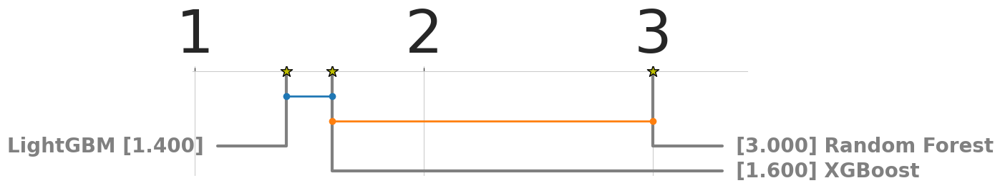

MSE
• Friedman p = 0.022371 → significativo
• Avg ranks: Random Forest: 3.00, XGBoost: 1.40, LightGBM: 1.60 



/usr/local/lib/python3.12/dist-packages/scikit_posthocs/_plotting.py:528: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  (x for x in crossbar_sets if len(x) > 1), key=lambda x: ranks[list(x)].min()
/usr/local/lib/python3.12/dist-packages/scikit_posthocs/_plotting.py:549: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  [ranks[i] for i in bar],


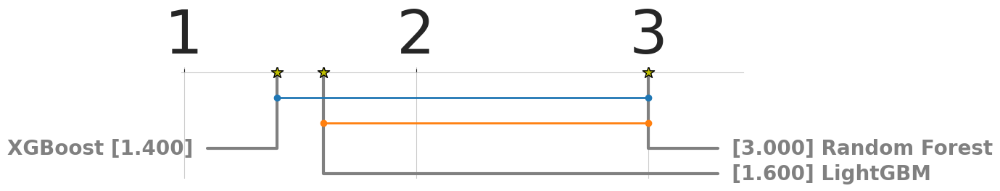

RMSE
• Friedman p = 0.022371 → significativo
• Avg ranks: Random Forest: 3.00, XGBoost: 1.40, LightGBM: 1.60 



/usr/local/lib/python3.12/dist-packages/scikit_posthocs/_plotting.py:528: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  (x for x in crossbar_sets if len(x) > 1), key=lambda x: ranks[list(x)].min()
/usr/local/lib/python3.12/dist-packages/scikit_posthocs/_plotting.py:549: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  [ranks[i] for i in bar],


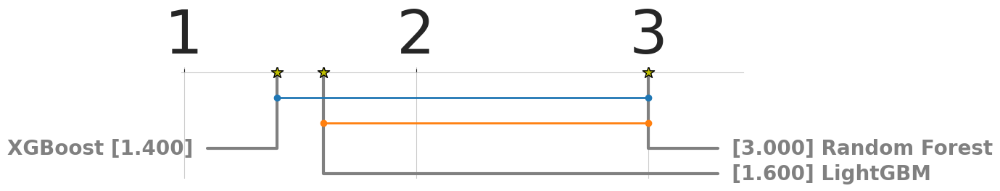

R²
• Friedman p = 0.022371 → significativo
• Avg ranks: Random Forest: 3.00, XGBoost: 1.40, LightGBM: 1.60 



/usr/local/lib/python3.12/dist-packages/scikit_posthocs/_plotting.py:528: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  (x for x in crossbar_sets if len(x) > 1), key=lambda x: ranks[list(x)].min()
/usr/local/lib/python3.12/dist-packages/scikit_posthocs/_plotting.py:549: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  [ranks[i] for i in bar],


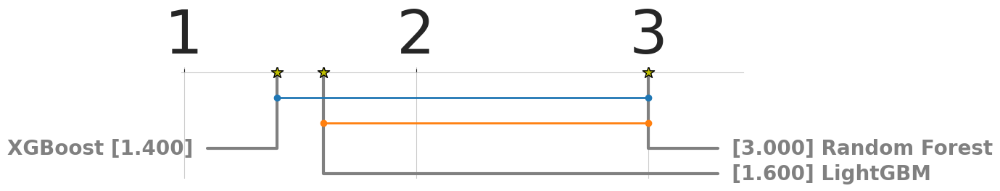

In [188]:
models = {
    'LightGBM': {'MAE': maes_lgbm, 'MSE': mses_lgbm, 'RMSE': rmses_lgbm, 'R²': r2s_lgbm},
    'XGBoost': {'MAE': maes_xgb, 'MSE': mses_xgb, 'RMSE': rmses_xgb, 'R²': r2s_xgb},
    'Random Forest': {'MAE': maes_rf, 'MSE': mses_rf, 'RMSE': rmses_rf, 'R²': r2s_rf}
}

for metric in ['MAE','MSE','RMSE','R²']:
    data = np.array([models[m][metric] for m in ['Random Forest','XGBoost','LightGBM']]).T
    ranks = np.array([stats.rankdata(-row) if metric=='R²' else stats.rankdata(row) for row in data])
    avg_ranks = pd.Series(ranks.mean(axis=0), index=['Random Forest','XGBoost','LightGBM'])
    stat, p = friedmanchisquare(*[models[m][metric] for m in ['Random Forest','XGBoost','LightGBM']])

    print(f"{metric}")
    print(f"• Friedman p = {p:.6f} → {'significativo' if p<0.05 else 'não significativo'}")
    print("• Avg ranks: " + ", ".join(f"{k}: {v:.2f}" for k,v in avg_ranks.items()), "\n")

    if p < 0.05:
        test_results = sp.posthoc_nemenyi_friedman(data)
        plt.figure(figsize=(10,2), dpi = 100)
        sp.critical_difference_diagram(avg_ranks, test_results, label_fmt_left='{label} [{rank:.3f}]  ',
    label_fmt_right='  [{rank:.3f}] {label}',
    text_h_margin=0.3,
    label_props={'fontweight': 'bold', 'fontsize': 20},
    crossbar_props={'color': None, 'marker': 'o'},
    marker_props={'marker': '*', 's': 150, 'color': 'y', 'edgecolor': 'k'},
    elbow_props={'color': 'gray'},)

        plt.savefig('cd.pdf', format='pdf', bbox_inches="tight", dpi=2400)
        plt.show()


#Análise de Resíduos

## Resíduos vs. Predições

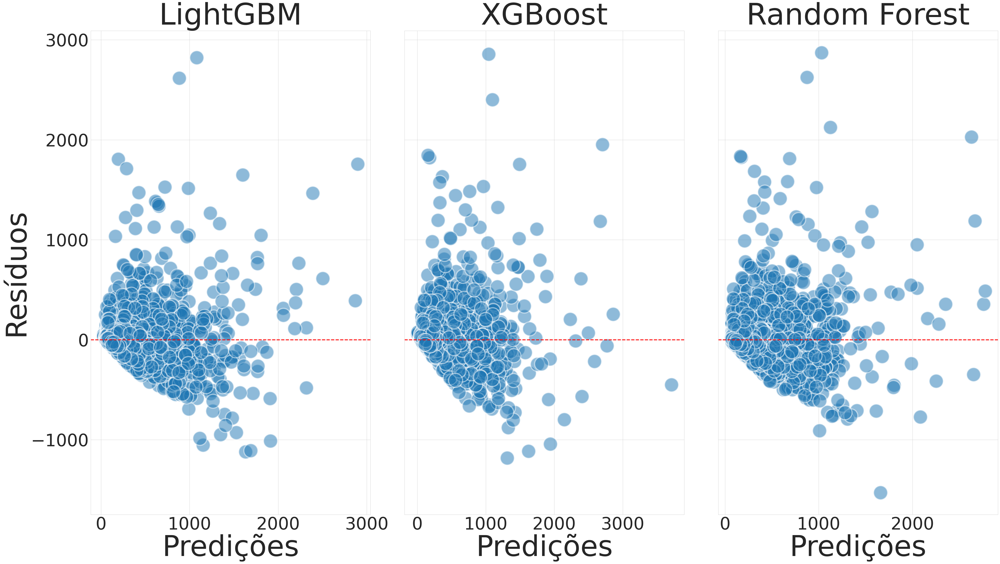

In [189]:
y_true_all_folds = all_y_test_rf

residuals_rf = y_true_all_folds - all_predictions_rf
residuals_xgb = y_true_all_folds - all_predictions_xgb
residuals_lgbm = y_true_all_folds - all_predictions_lgbm

fig, axes = plt.subplots(1, 3, figsize=(50, 30), sharey=True)

sns.scatterplot(x=all_predictions_lgbm, y=residuals_lgbm, alpha=0.5, ax=axes[0], s=2400)
axes[0].axhline(0, color='red', linestyle='--')
axes[0].set_title('LightGBM', fontsize=104)
axes[0].set_xlabel('Predições', fontsize=100)
axes[0].set_ylabel('Resíduos', fontsize=100)

sns.scatterplot(x=all_predictions_xgb, y=residuals_xgb, alpha=0.5, ax=axes[1], s=2400)
axes[1].axhline(0, color='red', linestyle='--')
axes[1].set_title('XGBoost', fontsize=104)
axes[1].set_xlabel('Predições', fontsize=100)
axes[1].set_ylabel('')

sns.scatterplot(x=all_predictions_rf, y=residuals_rf, alpha=0.5, ax=axes[2], s=2400)
axes[2].axhline(0, color='red', linestyle='--')
axes[2].set_title('Random Forest', fontsize=104)
axes[2].set_xlabel('Predições', fontsize=100)
axes[2].set_ylabel('')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('residuos.pdf', format='pdf', bbox_inches="tight", dpi=2400)
plt.show()

## Resíduos vs. Valores Reais

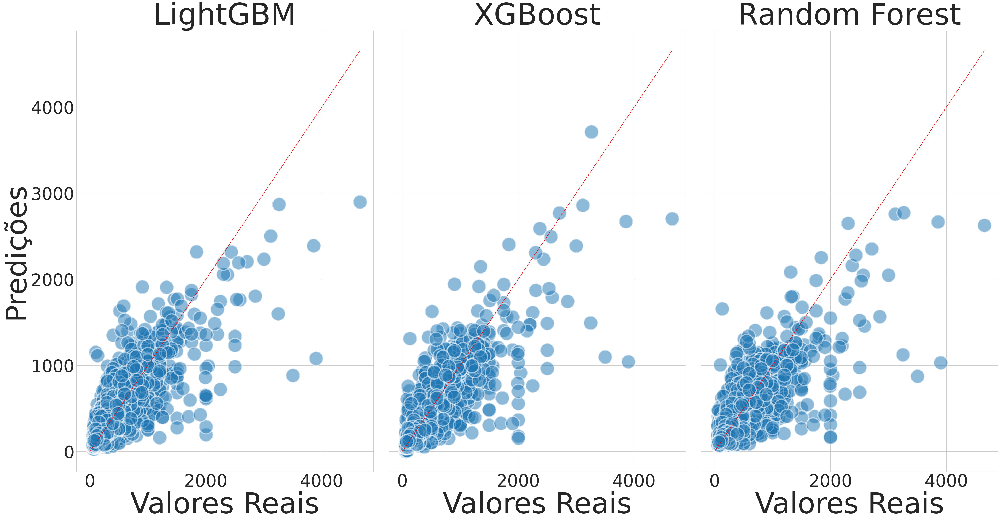

In [190]:
y_true_all_folds = all_y_test_rf

min_val = min(y_true_all_folds.min(), all_predictions_lgbm.min(), all_predictions_xgb.min(), all_predictions_rf.min())
max_val = max(y_true_all_folds.max(), all_predictions_lgbm.max(), all_predictions_xgb.max(), all_predictions_rf.max())

fig, axes = plt.subplots(1, 3, figsize=(50, 28.125), sharex=True, sharey=True)

sns.scatterplot(x=y_true_all_folds, y=all_predictions_lgbm, alpha=0.5, ax=axes[0], s=2400)
axes[0].plot([min_val, max_val], [min_val, max_val], '--', color='red', linewidth=2)
axes[0].set_title('LightGBM', fontsize=104)
axes[0].set_xlabel('Valores Reais', fontsize=100)
axes[0].set_ylabel('Predições', fontsize=100)
axes[0].grid(True)

sns.scatterplot(x=y_true_all_folds, y=all_predictions_xgb, alpha=0.5, ax=axes[1], s=2400)
axes[1].plot([min_val, max_val], [min_val, max_val], '--', color='red', linewidth=2)
axes[1].set_title('XGBoost', fontsize=104)
axes[1].set_xlabel('Valores Reais', fontsize=100)
axes[1].set_ylabel('');
axes[1].grid(True)

sns.scatterplot(x=y_true_all_folds, y=all_predictions_rf, alpha=0.5, ax=axes[2], s=2400)
axes[2].plot([min_val, max_val], [min_val, max_val], '--', color='red', linewidth=2)
axes[2].set_title('Random Forest', fontsize=104)
axes[2].set_xlabel('Valores Reais', fontsize=100)
axes[2].set_ylabel('');
axes[2].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('residuosreais.pdf', format='pdf', bbox_inches="tight", dpi=2400)
plt.show()

# Comparação entre os modelos (Métricas computacionais)

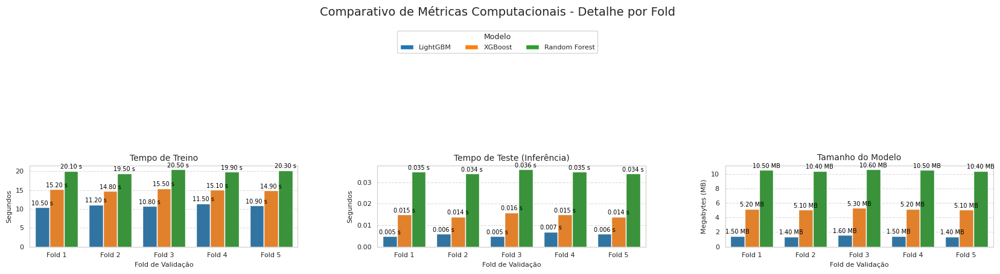

In [138]:
from matplotlib.patches import Patch


models = ['LightGBM', 'XGBoost', 'Random Forest']


results_map = {
    'Tempo_Treino': {'LightGBM': train_times_lgbm, 'XGBoost': train_times_xgb, 'Random Forest': train_times_rf},
    'Tempo_Teste': {'LightGBM': test_times_lgbm, 'XGBoost': test_times_xgb, 'Random Forest': test_times_rf},
    'Tamanho': {'LightGBM': model_sizes_lgbm, 'XGBoost': model_sizes_xgb, 'Random Forest': model_sizes_rf},
}
num_folds = len(results_map['Tempo_Treino']['LightGBM'])
MODEL_PALETTE = {'LightGBM': '#1f77b4', 'XGBoost': '#ff7f0e', 'Random Forest': '#2ca02c'}

data_list = []
for model_name in models:
    for i in range(num_folds):
        data_list.append({
            'Fold': f'Fold {i+1}',
            'Modelo': model_name,
            'Tempo_Treino': results_map['Tempo_Treino'][model_name][i],
            'Tempo_Teste': results_map['Tempo_Teste'][model_name][i],
            'Tamanho': results_map['Tamanho'][model_name][i],
        })
df_data_for_plot = pd.DataFrame(data_list)


def plot_fold_barplot(ax, data, metric, title, ylabel, palette, fmt_string, order=None):

    sns.barplot(
        x='Fold',
        y=metric,
        hue='Modelo',
        data=data,
        order=[f'Fold {i+1}' for i in range(num_folds)],
        ax=ax,
        palette=palette,
        errorbar=None,
        legend=False
    )

    ax.set_title(title, fontsize=10)
    ax.set_ylabel(ylabel, fontsize=8)
    ax.set_xlabel('Fold de Validação', fontsize=8)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=8)

    for p in ax.patches:
        height = p.get_height()
        ax.text(
            p.get_x() + p.get_width() / 2.,
            height + (df_data_for_plot[metric].max() * 0.01),
            fmt_string.format(height),
            ha='center',
            va='bottom',
            fontsize=7,
            color='black'
        )

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Comparativo de Métricas Computacionais - Detalhe por Fold', fontsize=14, y=1.05)


plot_fold_barplot(
    axes[0], df_data_for_plot, 'Tempo_Treino', 'Tempo de Treino',
    'Segundos', MODEL_PALETTE, '{:.2f} s', order=models)

plot_fold_barplot(
    axes[1], df_data_for_plot, 'Tempo_Teste', 'Tempo de Teste (Inferência)',
    'Segundos', MODEL_PALETTE, '{:.3f} s', order=models)

plot_fold_barplot(
    axes[2], df_data_for_plot, 'Tamanho', 'Tamanho do Modelo',
    'Megabytes (MB)', MODEL_PALETTE, '{:.2f} MB', order=models)


legend_handles = [Patch(facecolor=MODEL_PALETTE[m], label=m) for m in models]
fig.legend(
    handles=legend_handles,
    title='Modelo',
    loc='upper center',
    bbox_to_anchor=(0.5, 0.98),
    ncol=3,
    fontsize=8,
    title_fontsize=9
)

plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

# Análise de importância das features

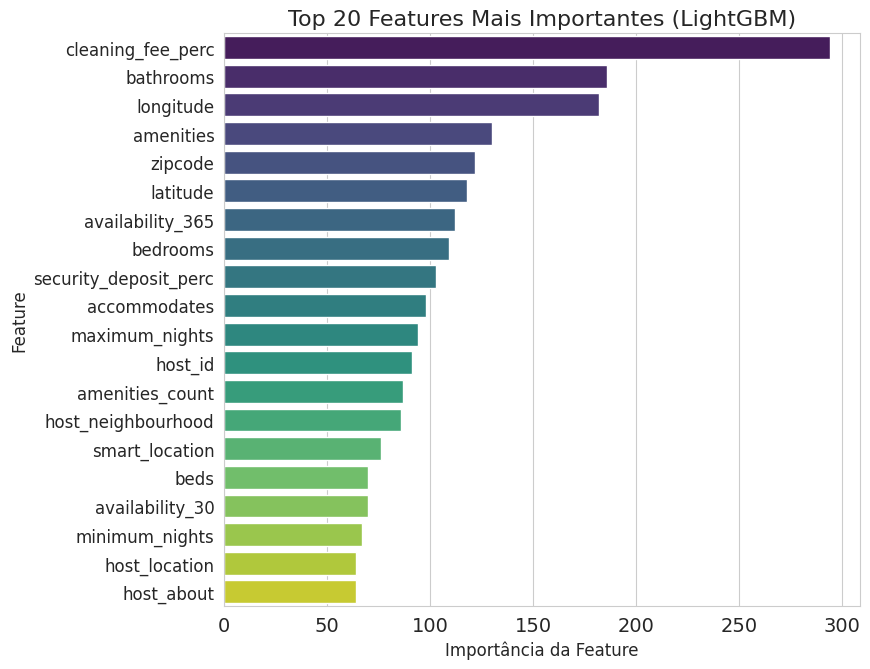

In [143]:
feature_importances = pd.Series(model_lgbm.feature_importances_, index=X_test.columns)

top_features = feature_importances.nlargest(20).iloc[::1]

plt.figure(figsize=(10, 8))

sns.barplot(
    x=top_features.values,
    y=top_features.index,
    palette='viridis',
    hue=top_features.index,
    legend=False,
)

plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', labelsize=14)

plt.title('Top 20 Features Mais Importantes (LightGBM)', fontsize=16)
plt.xlabel('Importância da Feature', fontsize=12)
plt.ylabel('Feature', fontsize=12)

plt.tight_layout()

plt.show()

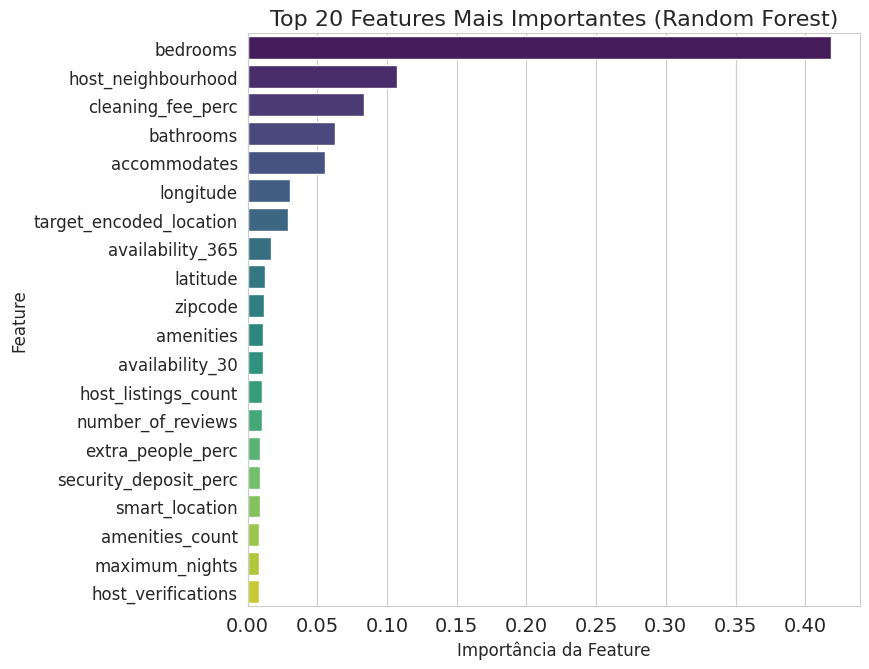

In [144]:
feature_importances = pd.Series(model_rf.feature_importances_, index=X_test.columns)

top_features = feature_importances.nlargest(20).iloc[::1]

plt.figure(figsize=(10, 8))

sns.barplot(
    x=top_features.values,
    y=top_features.index,
    palette='viridis',
    hue=top_features.index,
    legend=False,
)

plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', labelsize=14)

plt.title('Top 20 Features Mais Importantes (Random Forest)', fontsize=16)
plt.xlabel('Importância da Feature', fontsize=12)
plt.ylabel('Feature', fontsize=12)

plt.tight_layout()

plt.show()

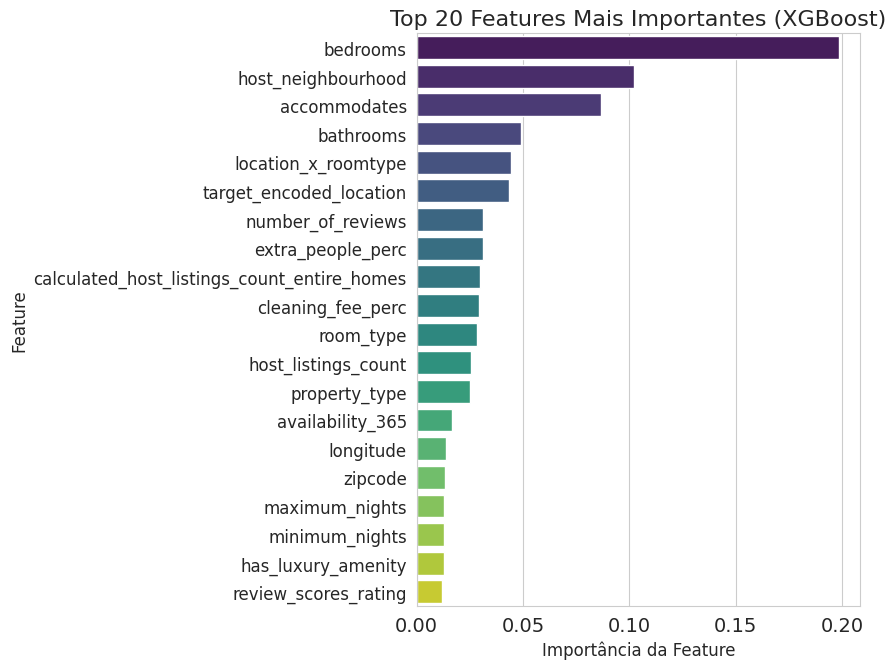

In [145]:
feature_importances = pd.Series(model_xgb.feature_importances_, index=X_test.columns)

top_features = feature_importances.nlargest(20).iloc[::1]

plt.figure(figsize=(10, 8))

sns.barplot(
    x=top_features.values,
    y=top_features.index,
    palette='viridis',
    hue=top_features.index,
    legend=False,
)

plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', labelsize=14)

plt.title('Top 20 Features Mais Importantes (XGBoost)', fontsize=16)
plt.xlabel('Importância da Feature', fontsize=12)
plt.ylabel('Feature', fontsize=12)

plt.tight_layout()

plt.show()